In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast
import os
import time
from datetime import datetime, timedelta
import jenkspy
import plotly.express as px
import plotly.graph_objects as go

In [2]:
pd.set_option('display.max_columns', 50)
START_POI = 0
END_POI = 450
START_DATE = '2018-12-31'
TOTAL_DAYS = 400
TRAIN_RATIO = 0.7
VALID_RATIO = 0.2
TEST_RATIO = 1 - (TRAIN_RATIO + VALID_RATIO)
WINDOW_SIZE = 24
HORIZON = 6

In [3]:
class bounding_box:
    def __init__(self, _lat_min, _lon_min,_lat_max,_lon_max):
        self.lat_min = _lat_min
        self.lon_min = _lon_min
        self.lat_max = _lat_max
        self.lon_max = _lon_max


class stat_collector:
    def __init__(self):
        self.parquet_file_count=0
        self.data_record_count = 0
        self.memory_usage_in_GB = 0		#gives an estimate of the total RAM usage if all files were read into memory at the same time.
        self.unique_device_count = 0
        self.avg_pos_acc = 0
        self.starting_time = time.process_time()
        self.elapsed_time = time.process_time()
        self.unique_geohash_count = 0
        
def load_poi_db(HT_range=0.2, ht_lat=29.749907, ht_lon=-95.358421):
    HT_box = bounding_box(ht_lat - HT_range, ht_lon - HT_range, ht_lat + HT_range, ht_lon + HT_range)

    bbox = HT_box
    poi_folder = "/storage/dataset/poi_haowen/CoreRecords-CORE_POI-2019_03-2020-03-25/"
    poi_columns = ["safegraph_place_id", "parent_safegraph_place_id", "location_name", "safegraph_brand_ids", "brands",
                   "top_category", "sub_category", "naics_code", "latitude", "longitude", "street_address", "city",
                   "region", "postal_code", "iso_country_code", "phone_number", "open_hours", "category_tags"]
    files = os.listdir(poi_folder)


    poi_s = stat_collector()
    poi_db = pd.DataFrame(columns=poi_columns)
    for f in files:
        if f[-3:] == 'csv' and 'brand' not in f:
            print(f)
            df = pd.read_csv(poi_folder + f)
            df = df[
                (df['latitude'] > bbox.lat_min) & (df['latitude'] < bbox.lat_max) & (df['longitude'] > bbox.lon_min) & (
                            df['longitude'] < bbox.lon_max)]
            poi_db = poi_db.append(df, ignore_index=True, sort=False)
            poi_s.memory_usage_in_GB += df.memory_usage(deep=True).sum() / 1000000000
            poi_s.data_record_count += df.shape[0]
            poi_s.parquet_file_count += 1
    return poi_db, poi_s


def get_merged_df(csv_path, start_row, end_row):

    #start = time.time()
    merge_df = pd.read_csv(csv_path)

    merge_df = merge_df.sort_values(by=['raw_visit_counts'], ascending=False)
    merge_df = merge_df.iloc[start_row:end_row]
    #print(merge_df)
    merge_df["visits_by_each_hour"] = merge_df["visits_by_each_hour"].apply(lambda x: ast.literal_eval(x))
    merge_df["visits_by_day"] = merge_df["visits_by_day"].apply(lambda x: ast.literal_eval(x))
    merge_df["visits_by_each_hour"] = merge_df["visits_by_each_hour"].apply(lambda x: x[:TOTAL_DAYS*24])
    merge_df["visits_by_day"] = merge_df["visits_by_day"].apply(lambda x: x[:TOTAL_DAYS])
    return merge_df


In [4]:
def masked_MAPE(v, v_, axis=None):
    '''
    Mean absolute percentage error.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :param axis: axis to do calculation.
    :return: int, MAPE averages on all elements of input.
    '''
    # TODO: Remove this line
    v_ = np.where(v_<0, 0,v_)
    
    mask = (v < 1E-5)
    percentage = np.abs(v_ - v) / np.abs(v)
    percentage = np.where(percentage > 5, 5, percentage) # TODO remove this
    if np.any(mask):
        masked_array = np.ma.masked_array(percentage, mask=mask)  # mask the dividing-zero as invalid
        result = masked_array.mean(axis=axis)
        if isinstance(result, np.ma.MaskedArray):
            return result.filled(np.nan)
        else:
            return result
    return np.mean(percentage, axis).astype(np.float64)


def MAPE(v, v_, axis=None):
    '''
    Mean absolute percentage error.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :param axis: axis to do calculation.
    :return: int, MAPE averages on all elements of input.
    '''
    # TODO: Remove this line
    v_ = np.where(v_<0, 0,v_)
    mape = (np.abs(v_ - v) / np.abs(v)+1e-5).astype(np.float64)
    mape = np.where(mape > 5, 5, mape)
    return np.mean(mape, axis)


def RMSE(v, v_, axis=None):
    '''
    Mean squared error.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :param axis: axis to do calculation.
    :return: int, RMSE averages on all elements of input.
    '''
    return np.sqrt(np.mean((v_ - v) ** 2, axis)).astype(np.float64)




def MAE(v, v_, axis=None):
    '''
    Mean absolute error.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :param axis: axis to do calculation.
    :return: int, MAE averages on all elements of input.
    '''

    return np.mean(np.abs(v_ - v), axis).astype(np.float64)


def evaluate(y, y_hat, by_step=False, by_node=False):
    '''
    :param y: array in shape of [count, time_step, node].
    :param y_hat: in same shape with y.
    :param by_step: evaluate by time_step dim.
    :param by_node: evaluate by node dim.
    :return: array of mape, mae and rmse.
    '''
    if not by_step and not by_node:
        return masked_MAPE(y, y_hat), MAE(y, y_hat), RMSE(y, y_hat)
    if by_step and by_node:
        return masked_MAPE(y, y_hat, axis=0), MAE(y, y_hat, axis=0), RMSE(y, y_hat, axis=0)
    if by_step:
        return masked_MAPE(y, y_hat, axis=(0, 2)), MAE(y, y_hat, axis=(0, 2)), RMSE(y, y_hat, axis=(0, 2))
    if by_node:
        return masked_MAPE(y, y_hat, axis=(0, 1)), MAE(y, y_hat, axis=(0, 1)), RMSE(y, y_hat, axis=(0, 1))

In [5]:
pred_saved_path = f'/home/users/arash/NGA Project/POI/code/StemGNN/output/houston_data/train_{START_POI}_{END_POI}'
preds_data = np.genfromtxt(f'{pred_saved_path}/predict.csv', delimiter=',')
target_data = np.genfromtxt(f'{pred_saved_path}/target.csv', delimiter=',')

In [6]:
csv_path_weekly = '/home/users/arash/datasets/safegraph/weekly_patterns_2018-12-31_2020-06-08_Houston.csv'
csv_poi_info = '/home/users/arash/datasets/safegraph/core_poi_info_2018-12-31_2020-06-08.csv'
weekly_patterns = get_merged_df(csv_path_weekly, START_POI, END_POI)
poi_info = pd.read_csv(csv_poi_info)
poi_df = pd.merge(weekly_patterns, poi_info, on='safegraph_place_id', how='inner')
poi_df

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall
3,sg:73e44ffdbcb24363bf01b6158373b9f3,"[2479, 2866, 3465, 3178, 3023, 2940, 3209, 240...","[19, 12, 8, 31, 67, 98, 127, 136, 192, 108, 16...",1350310,George Bush Intercontinental Airport Terminal E,3950 S Terminal Terminal E,Houston,TX,77066,US,NaN,NaN
4,sg:360d88ef2ced4be180ea24290b9f9df4,"[2410, 2607, 3235, 2913, 2806, 2217, 3011, 217...","[28, 45, 53, 36, 94, 116, 104, 132, 103, 189, ...",1240632,William P Hobby Airport,7800 Airport Blvd,Houston,TX,77061,US,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
445,sg:50d654af9ec04067a4e8b63f3e8361e4,"[3, 0, 6, 22, 5, 3, 7, 20, 161, 199, 198, 169,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, ...",44632,Woodcreek Middle,14600 Woodson Park Dr,Houston,TX,77044,US,NaN,NaN
446,sg:6e842bcbcd5d4f989aa56736a5171a36,"[2, 1, 21, 20, 33, 11, 5, 35, 37, 47, 45, 36, ...","[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",44545,University of Houston Campus Recreation,4500 University Dr University of Houston,Houston,TX,77004,US,NaN,NaN
447,sg:7ed5ad83ad65496f8c9606728a6e67ca,"[22, 11, 12, 14, 19, 37, 27, 13, 11, 17, 24, 2...","[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 1, 0, ...",44503,Grotto Ristorante,1001 Avenida de las Americas Ste A,Houston,TX,77010,US,SG_BRAND_5ceb6ce74b02b96,Grotto Ristorante
448,sg:c17ad51fe88346f3a38a3fbd58a57008,"[24, 6, 46, 61, 51, 20, 4, 69, 75, 73, 87, 79,...","[1, 0, 0, 0, 0, 0, 0, 4, 6, 5, 0, 0, 1, 0, 0, ...",44488,Challenge Early College H S,5601 West Loop S,Houston,TX,77081,US,NaN,NaN


In [7]:
poi_df['visits_by_day'].apply(lambda x: np.median(x)).to_numpy()

array([7968. , 3213.5, 2817.5, 2979.5, 2710.5, 1980.5, 1997.5, 1300.5,
       1198.5, 1342. , 1052.5,  900. ,  825.5,  769. ,   72. ,  116. ,
        727.5,  596. ,  573. ,  606.5,  666. ,  549. ,  679. ,  554.5,
        491.5,  651. ,  306. ,  484. ,  445. ,  635.5,  551.5,  455. ,
        180.5,  466.5,  433.5,  473. ,  496. ,  414.5,  498.5,  389.5,
        461. ,  397.5,  396.5,  206.5,  364.5,  357.5,  369. ,  382.5,
        302.5,  341. ,  402. ,  330. ,  125.5,  344.5,  351. ,  328. ,
        361. ,  276.5,  341. ,  299. ,  249. ,  145.5,  283.5,  284.5,
        325. ,  268. ,  283. ,  308. ,   11. ,  265. ,  274. ,  247.5,
        253. ,  260. ,  354. ,  251. ,  253. ,  217.5,  257. ,   46. ,
        233. ,  239. ,  248. ,  210.5,  253. ,  327.5,  232.5,   58. ,
        327. ,  241. ,  277. ,  202.5,  214. ,  240. ,  258. ,  221. ,
        256. ,  222. ,  225. ,  255. ,  226. ,  210.5,  246. ,  224. ,
         96. ,  215. ,  220. ,  265.5,  216. ,  242.5,  200. ,  212.5,
      

In [8]:
# median_visit_nums = np.median(target_data, axis=0).round()
# mean_visit_nums = np.mean(target_data, axis=0)
median_visit_nums = poi_df['visits_by_day'].apply(lambda x: np.median(x)).to_numpy().round()
mean_visit_nums = poi_df['visits_by_day'].apply(lambda x: np.mean(x)).to_numpy().round()
median_visit_nums
mean_visit_nums

array([7995., 3208., 3112., 2989., 2730., 2176., 2023., 1300., 1234.,
       1142., 1064.,  923.,  878.,  781.,  801.,  870.,  643.,  738.,
        606.,  641.,  589.,  566.,  595.,  570.,  539.,  540.,  552.,
        516.,  463.,  501.,  479.,  505.,  497.,  478.,  448.,  487.,
        449.,  422.,  418.,  410.,  400.,  421.,  439.,  446.,  376.,
        375.,  379.,  407.,  380.,  356.,  357.,  337.,  372.,  364.,
        351.,  336.,  370.,  355.,  346.,  306.,  346.,  334.,  295.,
        296.,  308.,  279.,  298.,  307.,  339.,  272.,  277.,  284.,
        261.,  267.,  282.,  263.,  264.,  299.,  262.,  266.,  244.,
        248.,  246.,  281.,  256.,  272.,  268.,  272.,  263.,  242.,
        271.,  269.,  229.,  241.,  258.,  233.,  240.,  230.,  232.,
        253.,  229.,  253.,  249.,  227.,  250.,  246.,  238.,  231.,
        228.,  227.,  212.,  221.,  220.,  215.,  226.,  241.,  211.,
        239.,  234.,  229.,  229.,  210.,  206.,  235.,  209.,  217.,
        211.,  230.,

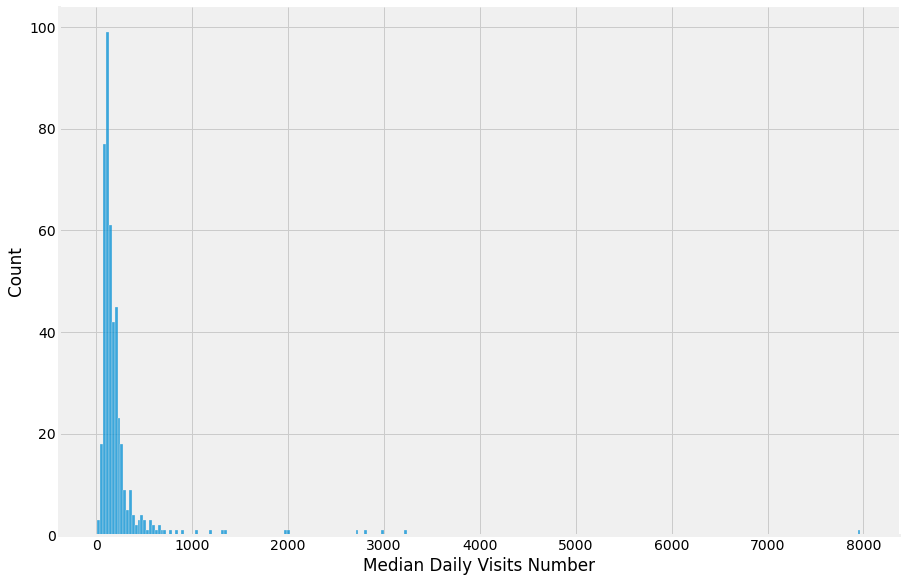

In [9]:
plt.style.use('fivethirtyeight')
sns.displot(median_visit_nums, height=8, aspect=1.6)
plt.xlabel('Median Daily Visits Number')
plt.savefig(f"img/median_visits_dist.png", bbox_inches = 'tight')

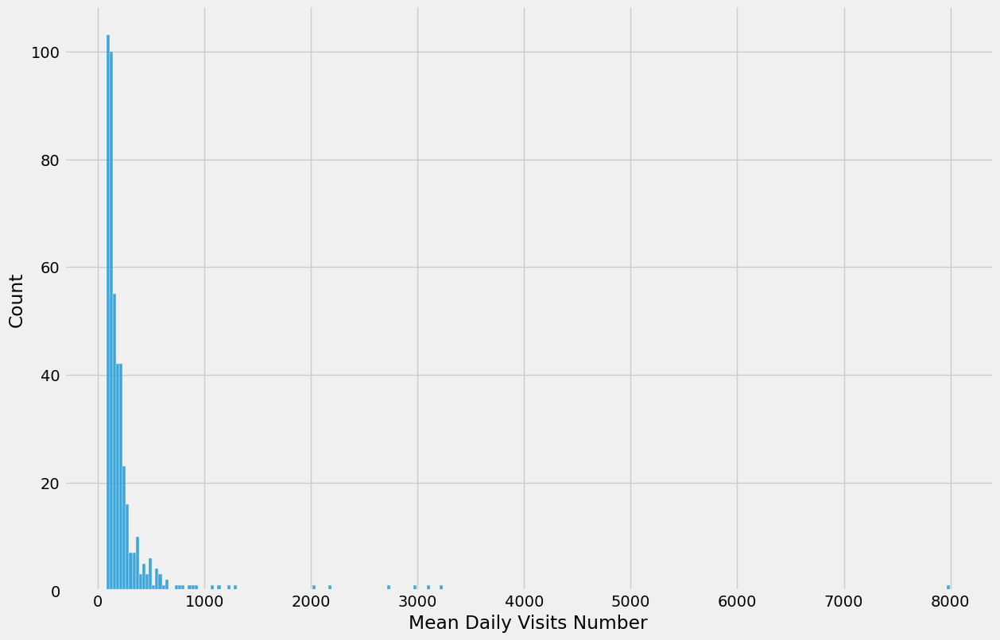

In [10]:
plt.style.use('fivethirtyeight')
sns.displot(mean_visit_nums, height=8, aspect=1.6)
plt.xlabel('Mean Daily Visits Number')
plt.savefig(f"img/mean_visits_dist.png", bbox_inches = 'tight')

In [11]:
NUM_BINS = 3
breaks = jenkspy.jenks_breaks(median_visit_nums, nb_class=NUM_BINS)
print(f'breaks: {breaks}')

breaks: [11.0, 1198.0, 3214.0, 7968.0]


In [12]:
bucket_names = ['bucket' + str(i) for i in range(NUM_BINS)]
# pd.cut(median_visit_nums, bins=breaks, labels=bucket_names, include_lowest=True)
pd.cut(median_visit_nums, bins=breaks, include_lowest=True)

[(3214.0, 7968.0], (1198.0, 3214.0], (1198.0, 3214.0], (1198.0, 3214.0], (1198.0, 3214.0], ..., (10.999, 1198.0], (10.999, 1198.0], (10.999, 1198.0], (10.999, 1198.0], (10.999, 1198.0]]
Length: 450
Categories (3, interval[float64, right]): [(10.999, 1198.0] < (1198.0, 3214.0] < (3214.0, 7968.0]]

In [13]:
pd.qcut(median_visit_nums, q=NUM_BINS)

[(188.333, 7968.0], (188.333, 7968.0], (188.333, 7968.0], (188.333, 7968.0], (188.333, 7968.0], ..., (10.999, 113.667], (10.999, 113.667], (10.999, 113.667], (10.999, 113.667], (10.999, 113.667]]
Length: 450
Categories (3, interval[float64, right]): [(10.999, 113.667] < (113.667, 188.333] < (188.333, 7968.0]]

In [14]:
date_format = r'%Y-%m-%d'
start_time = datetime.strptime(START_DATE, date_format)
end_time = start_time + timedelta(days=TOTAL_DAYS)
time_span = pd.date_range(start_time, end_time, freq='1H', closed='left').to_numpy()
time_span

array(['2018-12-31T00:00:00.000000000', '2018-12-31T01:00:00.000000000',
       '2018-12-31T02:00:00.000000000', ...,
       '2020-02-03T21:00:00.000000000', '2020-02-03T22:00:00.000000000',
       '2020-02-03T23:00:00.000000000'], dtype='datetime64[ns]')

In [15]:
train_days = int(TRAIN_RATIO * TOTAL_DAYS)
valid_days = int(TOTAL_DAYS * VALID_RATIO)
test_days = TOTAL_DAYS - train_days - valid_days
valid_dates = time_span[train_days*24 + WINDOW_SIZE:(train_days + valid_days)*24 - HORIZON + 1]
valid_dates


array(['2019-10-08T00:00:00.000000000', '2019-10-08T01:00:00.000000000',
       '2019-10-08T02:00:00.000000000', ...,
       '2019-12-25T16:00:00.000000000', '2019-12-25T17:00:00.000000000',
       '2019-12-25T18:00:00.000000000'], dtype='datetime64[ns]')

In [16]:
preds_df = pd.DataFrame(median_visit_nums, columns=['median_visits'])
preds_df['cut_jenks_med'] = pd.cut(median_visit_nums, 
                                   bins=jenkspy.jenks_breaks(median_visit_nums, nb_class=NUM_BINS), 
                                   include_lowest=True)
preds_df['cut_jenks_mean'] = pd.cut(mean_visit_nums, 
                                   bins=jenkspy.jenks_breaks(mean_visit_nums, nb_class=NUM_BINS), 
                                   include_lowest=True)
preds_df['qcut_med'] = pd.qcut(median_visit_nums, q=NUM_BINS)
preds_df['qcut_mean'] = pd.qcut(mean_visit_nums, q=NUM_BINS)
preds_df

,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean
0,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]"
1,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
2,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
3,2980.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
4,2710.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
...,...,...,...,...,...
445,44.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
446,84.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
447,33.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
448,84.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"


In [17]:
poi_db, poi_s = load_poi_db(HT_range=1.5)

core_poi-part2.csv
core_poi-part5.csv
core_poi-part4.csv
core_poi-part3.csv
core_poi-part1.csv


In [18]:
poi_df = poi_df.merge(poi_db, how='left', on='safegraph_place_id', suffixes=('', '_y'))
poi_df.drop(poi_df.filter(regex='_y$').columns, axis=1, inplace=True)
poi_df = poi_df.join(preds_df, how='inner')
poi_df

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]"
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall,NaN,Lessors of Real Estate,Malls,531120.0,29.738954,-95.463803,NaN,"{ ""Mon"": [[""10:00"", ""19:00""]], ""Tue"": [[""10:00...",NaN,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
3,sg:73e44ffdbcb24363bf01b6158373b9f3,"[2479, 2866, 3465, 3178, 3023, 2940, 3209, 240...","[19, 12, 8, 31, 67, 98, 127, 136, 192, 108, 16...",1350310,George Bush Intercontinental Airport Terminal E,3950 S Terminal Terminal E,Houston,TX,77066,US,NaN,NaN,sg:7dea7a58e8424b22ba0d0b96bc1b6cc9,Traveler Accommodation,Hotels (except Casino Hotels) and Motels,721110.0,29.986670,-95.337942,NaN,NaN,NaN,2980.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
4,sg:360d88ef2ced4be180ea24290b9f9df4,"[2410, 2607, 3235, 2913, 2806, 2217, 3011, 217...","[28, 45, 53, 36, 94, 116, 104, 132, 103, 189, ...",1240632,William P Hobby Airport,7800 Airport Blvd,Houston,TX,77061,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.646145,-95.277014,1.713640e+10,NaN,NaN,2710.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,sg:50d654af9ec04067a4e8b63f3e8361e4,"[3, 0, 6, 22, 5, 3, 7, 20, 161, 199, 198, 169,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, ...",44632,Woodcreek Middle,14600 Woodson Park Dr,Houston,TX,77044,US,NaN,NaN,NaN,Elementary and Secondary Schools,Elementary and Secondary Schools,611110.0,29.931872,-95.201014,1.281642e+10,NaN,NaN,44.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
446,sg:6e842bcbcd5d4f989aa56736a5171a36,"[2, 1, 21, 20, 33, 11, 5, 35, 37, 47, 45, 36, ...","[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",44545,University of Houston Campus Recreation,4500 University Dr University of Houston,Houston,TX,77004,US,NaN,NaN,NaN,Other Amusement and Recreation Industries,Fitness and Recreational Sports Centers,713940.0,29.717701,-95.338222,1.713744e+10,"{ ""Mon"": [[""6:00"", ""23:30""]], ""Tue"": [[""6:00"",...",NaN,84.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
447,sg:7ed5ad83ad65496f8c9606728a6e67ca,"[22, 11, 12, 14, 19, 37, 27, 13, 11, 17, 24, 2...","[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 1, 0, ...",44503,Grotto Ristorante,1001 Avenida de las Americas Ste A,Houston,TX,77010,US,SG_BRAND_5ceb6ce74b02b96,Grotto Ristorante,

In [19]:
nodes_mape = masked_MAPE(preds_data, target_data, axis=0)
nodes_mae = MAE(preds_data, target_data, axis=0)
nodes_mape_ser = pd.Series(nodes_mape, index=poi_df.index)
nodes_mae_ser = pd.Series(nodes_mae, index=poi_df.index)
poi_err_df = poi_df.copy()
poi_err_df['mape'] = nodes_mape_ser
poi_err_df['mae'] = nodes_mae_ser
poi_err_df

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean,mape,mae
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.237504,55.721854
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.297731,26.928987
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall,NaN,Lessors of Real Estate,Malls,531120.0,29.738954,-95.463803,NaN,"{ ""Mon"": [[""10:00"", ""19:00""]], ""Tue"": [[""10:00...",NaN,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.308996,23.249527
3,sg:73e44ffdbcb24363bf01b6158373b9f3,"[2479, 2866, 3465, 3178, 3023, 2940, 3209, 240...","[19, 12, 8, 31, 67, 98, 127, 136, 192, 108, 16...",1350310,George Bush Intercontinental Airport Terminal E,3950 S Terminal Terminal E,Houston,TX,77066,US,NaN,NaN,sg:7dea7a58e8424b22ba0d0b96bc1b6cc9,Traveler Accommodation,Hotels (except Casino Hotels) and Motels,721110.0,29.986670,-95.337942,NaN,NaN,NaN,2980.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.295219,24.901680
4,sg:360d88ef2ced4be180ea24290b9f9df4,"[2410, 2607, 3235, 2913, 2806, 2217, 3011, 217...","[28, 45, 53, 36, 94, 116, 104, 132, 103, 189, ...",1240632,William P Hobby Airport,7800 Airport Blvd,Houston,TX,77061,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.646145,-95.277014,1.713640e+10,NaN,NaN,2710.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.279968,23.901681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,sg:50d654af9ec04067a4e8b63f3e8361e4,"[3, 0, 6, 22, 5, 3, 7, 20, 161, 199, 198, 169,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, ...",44632,Woodcreek Middle,14600 Woodson Park Dr,Houston,TX,77044,US,NaN,NaN,NaN,Elementary and Secondary Schools,Elementary and Secondary Schools,611110.0,29.931872,-95.201014,1.281642e+10,NaN,NaN,44.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]",0.885611,2.081346
446,sg:6e842bcbcd5d4f989aa56736a5171a36,"[2, 1, 21, 20, 33, 11, 5, 35, 37, 47, 45, 36, ...","[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",44545,University of Houston Campus Recreation,4500 University Dr University of Houston,Houston,TX,77004,US,NaN,NaN,NaN,Other Amusement and Recreation Industries,Fitness and Recreational Sports Centers,713940.0,29.717701,-95.338222,1.713744e+10,"{ ""Mon"": [[""6:00"", ""23:30""]], ""Tue"": [[""6:00"",...",NaN,84.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]",0.719036,2.338582
447,sg:7ed5ad83ad65496f8c9606728a6e67ca,"[22, 11, 12, 14, 19, 37, 27, 13, 11, 17, 24, 2...","[0, 0, 0, 0, 0, 1, 0, 0, 

In [20]:
bin_cols = ['cut_jenks_med', 'cut_jenks_mean', 'qcut_med', 'qcut_mean']

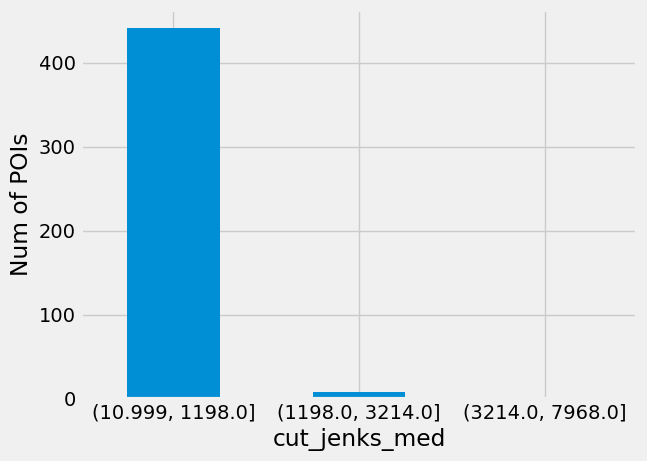

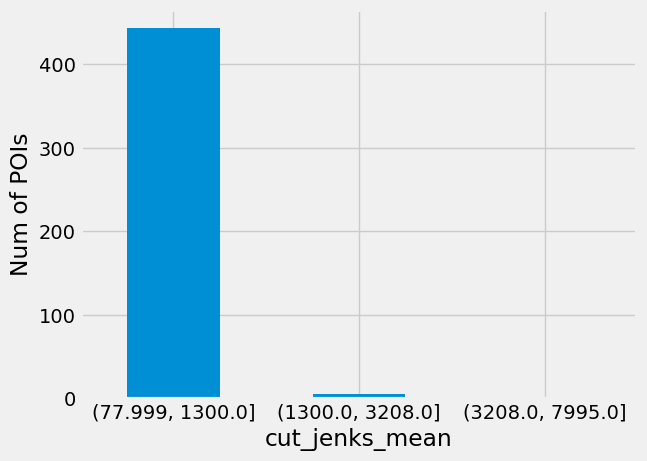

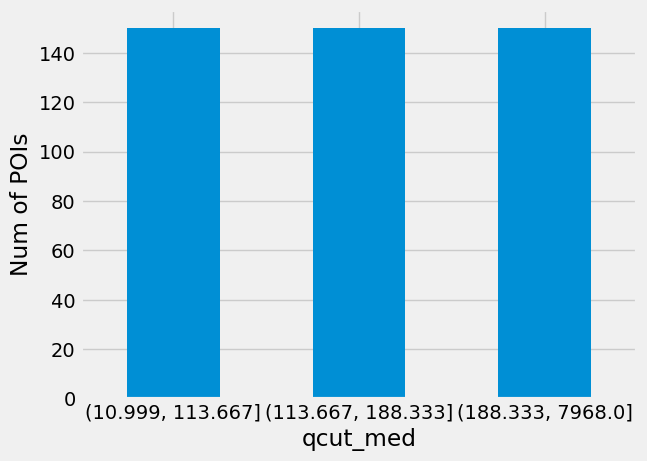

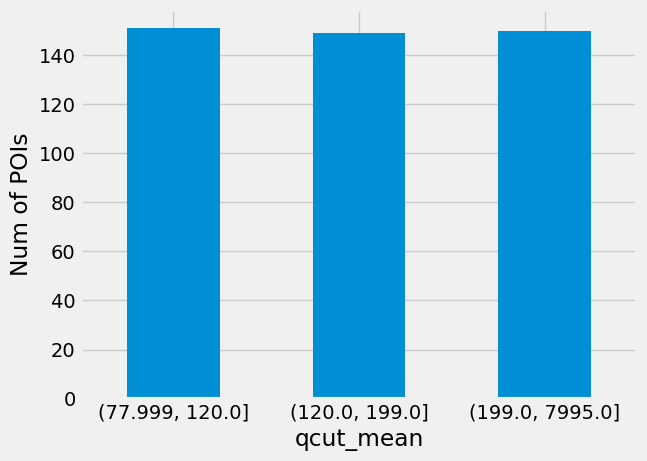

In [21]:
for agg_col in bin_cols:
    fig, ax = plt.subplots()    
    poi_err_df.groupby(agg_col)['safegraph_place_id'].count().plot(kind='bar', rot=0)
    plt.ylabel('Num of POIs')
    plt.savefig(f"img/num_pois_{agg_col}.png", bbox_inches = 'tight')

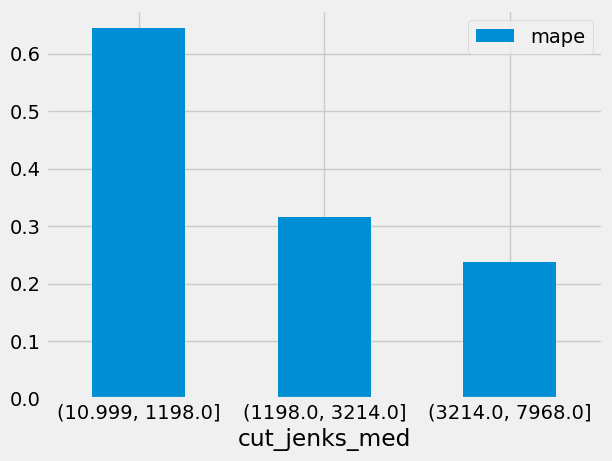

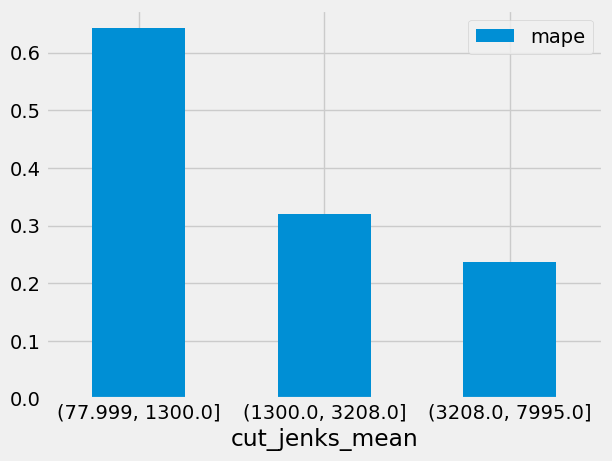

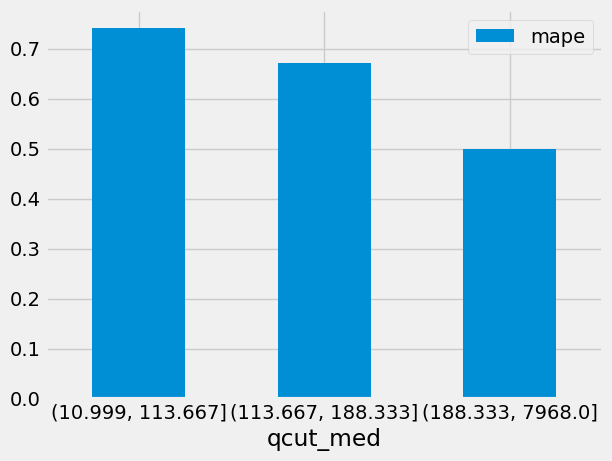

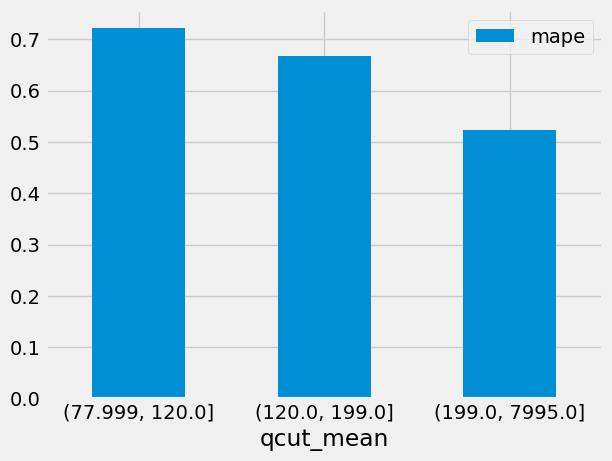

In [22]:
for i, agg_col in enumerate(bin_cols):
    poi_err_df.groupby(agg_col)[['mape']].mean().plot(kind='bar', rot=0)
    plt.savefig(f"img/mape_in_cuts_{agg_col}.png", bbox_inches = 'tight')

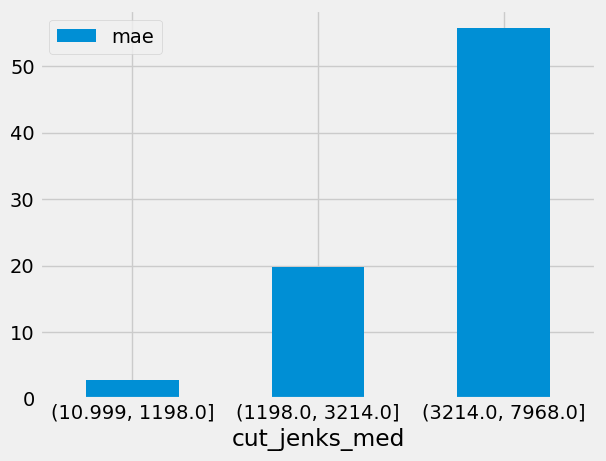

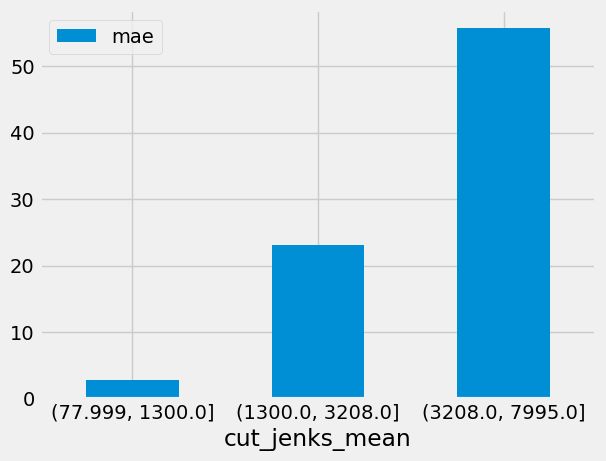

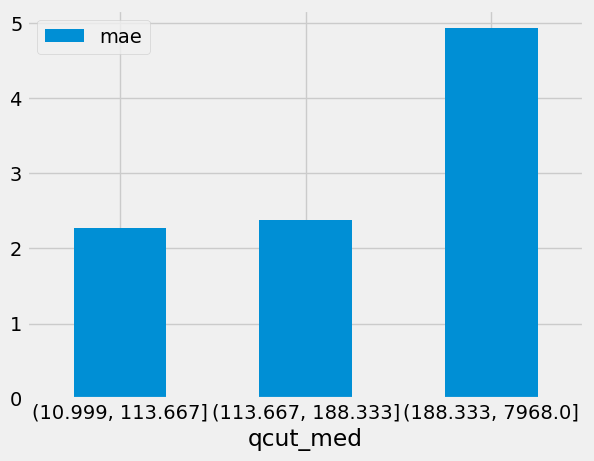

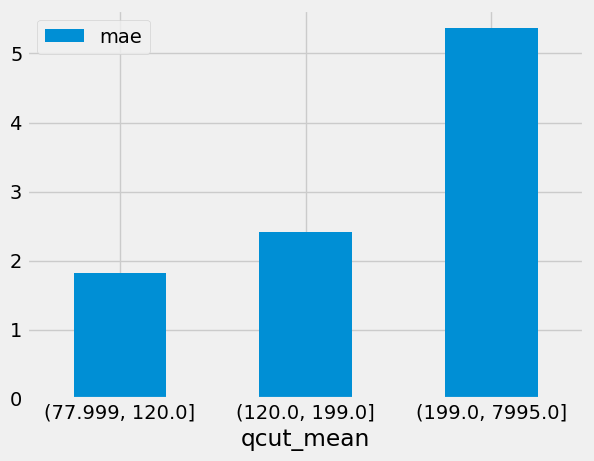

In [23]:
for i, agg_col in enumerate(bin_cols):
    poi_err_df.groupby(agg_col)[['mae']].mean().plot(kind='bar', rot=0)
    plt.savefig(f"img/mae_in_cuts_{agg_col}.png", bbox_inches = 'tight')

In [24]:
def plot_map(df, save=False, file_name='fig1.png', metric='mape', max_size=15):
    fig = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                            hover_name="location_name", 
                            hover_data=["raw_visit_counts", "street_address",
                                        'top_category', 'sub_category'],
                            color=metric, 
                            size=metric,
                            zoom=9.5,
                            size_max=max_size,
                            opacity=0.5,
                            height=700,
                            width = 1000
    )
    colorbar=dict(len=.75,
                    title=metric)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.update_layout(coloraxis_colorbar=colorbar)
    fig.show()
    if save:
        fig.write_image(file_name, scale=3)


In [25]:
groups = []
grouped_err_df = poi_err_df.groupby('qcut_med')
for group in grouped_err_df.groups:
    groups.append([group, grouped_err_df.get_group(group)])
len(groups)

3

In [26]:
for group_key, group_df in groups:
    plot_map(group_df, True, f'img/mape_by_POI_group_{group_key}.png', metric='mape')

### Checking visit nums by category

In [27]:
poi_df

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]"
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall,NaN,Lessors of Real Estate,Malls,531120.0,29.738954,-95.463803,NaN,"{ ""Mon"": [[""10:00"", ""19:00""]], ""Tue"": [[""10:00...",NaN,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
3,sg:73e44ffdbcb24363bf01b6158373b9f3,"[2479, 2866, 3465, 3178, 3023, 2940, 3209, 240...","[19, 12, 8, 31, 67, 98, 127, 136, 192, 108, 16...",1350310,George Bush Intercontinental Airport Terminal E,3950 S Terminal Terminal E,Houston,TX,77066,US,NaN,NaN,sg:7dea7a58e8424b22ba0d0b96bc1b6cc9,Traveler Accommodation,Hotels (except Casino Hotels) and Motels,721110.0,29.986670,-95.337942,NaN,NaN,NaN,2980.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
4,sg:360d88ef2ced4be180ea24290b9f9df4,"[2410, 2607, 3235, 2913, 2806, 2217, 3011, 217...","[28, 45, 53, 36, 94, 116, 104, 132, 103, 189, ...",1240632,William P Hobby Airport,7800 Airport Blvd,Houston,TX,77061,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.646145,-95.277014,1.713640e+10,NaN,NaN,2710.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,sg:50d654af9ec04067a4e8b63f3e8361e4,"[3, 0, 6, 22, 5, 3, 7, 20, 161, 199, 198, 169,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, ...",44632,Woodcreek Middle,14600 Woodson Park Dr,Houston,TX,77044,US,NaN,NaN,NaN,Elementary and Secondary Schools,Elementary and Secondary Schools,611110.0,29.931872,-95.201014,1.281642e+10,NaN,NaN,44.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
446,sg:6e842bcbcd5d4f989aa56736a5171a36,"[2, 1, 21, 20, 33, 11, 5, 35, 37, 47, 45, 36, ...","[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",44545,University of Houston Campus Recreation,4500 University Dr University of Houston,Houston,TX,77004,US,NaN,NaN,NaN,Other Amusement and Recreation Industries,Fitness and Recreational Sports Centers,713940.0,29.717701,-95.338222,1.713744e+10,"{ ""Mon"": [[""6:00"", ""23:30""]], ""Tue"": [[""6:00"",...",NaN,84.0,"(10.999, 1198.0]","(77.999, 1300.0]","(10.999, 113.667]","(77.999, 120.0]"
447,sg:7ed5ad83ad65496f8c9606728a6e67ca,"[22, 11, 12, 14, 19, 37, 27, 13, 11, 17, 24, 2...","[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 1, 0, ...",44503,Grotto Ristorante,1001 Avenida de las Americas Ste A,Houston,TX,77010,US,SG_BRAND_5ceb6ce74b02b96,Grotto Ristorante,

In [28]:
poi_df['visits_by_each_hour'] = poi_df['visits_by_each_hour'].apply(lambda x: np.array(x))
poi_df['visits_by_day'] = poi_df['visits_by_day'].apply(lambda x: np.array(x))


In [29]:
agg_df = poi_df.groupby('top_category').agg({'visits_by_day': 'sum',
                                    'visits_by_each_hour': 'sum',
                                    'raw_visit_counts': 'sum',
                                    'safegraph_place_id': 'count'})

In [30]:
agg_df.columns = ['daily_visits', 'hourly_visits', 'raw_visits', 'count']
agg_df

,daily_visits,hourly_visits,raw_visits,count
top_category,,,,
Amusement Parks and Arcades,"[167, 151, 145, 140, 178, 212, 114, 79, 90, 94...","[0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 13, 15, 25, 18,...",56425,1
Automobile Dealers,"[423, 255, 425, 406, 465, 395, 195, 362, 426, ...","[0, 0, 0, 0, 1, 1, 7, 11, 14, 16, 24, 40, 35, ...",183807,3
Automotive Equipment Rental and Leasing,"[30, 0, 115, 146, 106, 11, 3, 162, 187, 213, 2...","[0, 0, 1, 0, 1, 3, 1, 5, 6, 1, 1, 1, 3, 5, 0, ...",52544,1
Book Stores and News Dealers,"[65, 11, 176, 202, 203, 27, 13, 186, 283, 241,...","[0, 1, 1, 0, 0, 3, 6, 11, 12, 4, 2, 4, 5, 5, 0...",165918,2
Building Material and Supplies Dealers,"[1324, 1024, 1211, 1352, 1606, 1657, 1437, 116...","[4, 3, 3, 3, 11, 12, 19, 36, 56, 85, 137, 146,...",1045663,18
Child Day Care Services,"[202, 78, 300, 235, 331, 303, 1072, 811, 1584,...","[0, 0, 0, 2, 2, 4, 6, 4, 13, 9, 6, 15, 12, 6, ...",502981,7
Clothing Stores,"[270, 185, 344, 370, 433, 197, 157, 335, 367, ...","[1, 0, 0, 1, 0, 1, 5, 21, 10, 11, 16, 32, 23, ...",140180,2
"Colleges, Universities, and Professional Schools","[518, 216, 1081, 1182, 1309, 574, 501, 1566, 2...","[3, 5, 10, 4, 8, 13, 29, 69, 56, 41, 41, 24, 4...",1095781,10
Continuing Care Retirement Communities and Assisted Living Facilities for the Elderly,"[185, 120, 233, 269, 263, 130, 150, 218, 265, ...","[4, 2, 0, 3, 1, 7, 23, 23, 8, 20, 7, 4, 6, 9, ...",117483,1


In [31]:
agg_df.loc[agg_df['count'] > 10]

,daily_visits,hourly_visits,raw_visits,count
top_category,,,,
Building Material and Supplies Dealers,"[1324, 1024, 1211, 1352, 1606, 1657, 1437, 116...","[4, 3, 3, 3, 11, 12, 19, 36, 56, 85, 137, 146,...",1045663,18
Department Stores,"[2060, 1485, 1456, 1716, 2033, 2141, 1787, 125...","[2, 1, 3, 2, 3, 3, 5, 11, 45, 67, 128, 183, 20...",826871,13
Elementary and Secondary Schools,"[1252, 543, 1949, 2067, 2723, 1425, 1870, 3829...","[9, 11, 11, 4, 9, 24, 84, 130, 122, 133, 111, ...",3169749,31
Gasoline Stations,"[3555, 3496, 5304, 5060, 4816, 3721, 4026, 408...","[27, 27, 19, 39, 82, 116, 182, 220, 297, 168, ...",2284110,13
General Medical and Surgical Hospitals,"[1910, 1261, 3196, 3582, 3399, 1513, 1462, 303...","[21, 22, 18, 31, 23, 39, 140, 146, 132, 115, 1...",1645570,13
"General Merchandise Stores, including Warehouse Clubs and Supercenters","[6315, 3540, 4776, 5779, 5881, 6310, 6213, 490...","[63, 38, 27, 30, 35, 47, 79, 89, 158, 275, 406...",3261066,30
Grocery Stores,"[4483, 2220, 2641, 3032, 3196, 3507, 3630, 294...","[9, 8, 13, 16, 34, 26, 43, 90, 114, 180, 299, ...",1774683,27
Lessors of Real Estate,"[36547, 22889, 28011, 32166, 37478, 38275, 317...","[148, 94, 82, 100, 141, 199, 265, 520, 840, 14...",16815248,132
"Museums, Historical Sites, and Similar Institutions","[1492, 1361, 1296, 1581, 2108, 8798, 1838, 146...","[8, 10, 8, 9, 9, 15, 35, 54, 69, 85, 107, 126,...",1414162,14


In [32]:
daily_range = pd.date_range(start=START_DATE, periods=len(poi_df['visits_by_day'].iloc[0]))
hourly_range = pd.date_range(start=START_DATE, periods=len(poi_df['visits_by_each_hour'].iloc[0]))
hourly_range

DatetimeIndex(['2018-12-31', '2019-01-01', '2019-01-02', '2019-01-03',
               '2019-01-04', '2019-01-05', '2019-01-06', '2019-01-07',
               '2019-01-08', '2019-01-09',
               ...
               '2045-04-03', '2045-04-04', '2045-04-05', '2045-04-06',
               '2045-04-07', '2045-04-08', '2045-04-09', '2045-04-10',
               '2045-04-11', '2045-04-12'],
              dtype='datetime64[ns]', length=9600, freq='D')

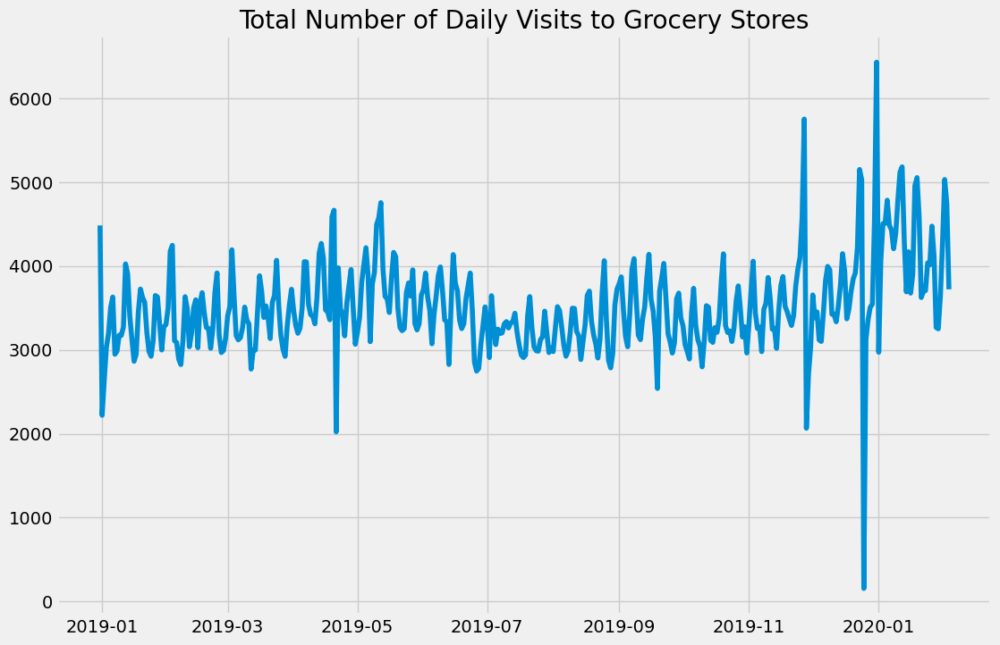

In [33]:
fig, ax = plt.subplots(figsize=(12, 8))
x = agg_df.loc['Grocery Stores', 'daily_visits']
plt.title('Total Number of Daily Visits to Grocery Stores')
plt.plot(daily_range, x)
plt.savefig(f"img/total_daily_visits_grocery_stores.png", bbox_inches = 'tight')

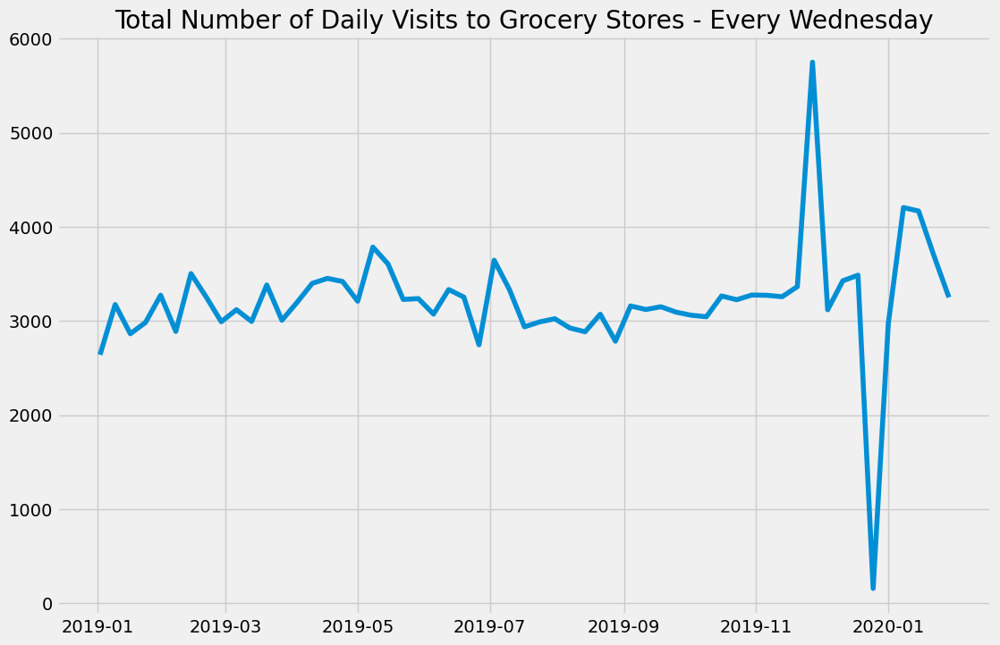

In [34]:
fig, ax = plt.subplots(figsize=(12, 8))
x = agg_df.loc['Grocery Stores', 'daily_visits']
plt.title('Total Number of Daily Visits to Grocery Stores - Every Wednesday')
plt.plot(daily_range[2::7], x[2::7])
plt.savefig(f"img/total_daily_visits_grocery_stores_every_wednesday.png", bbox_inches = 'tight')

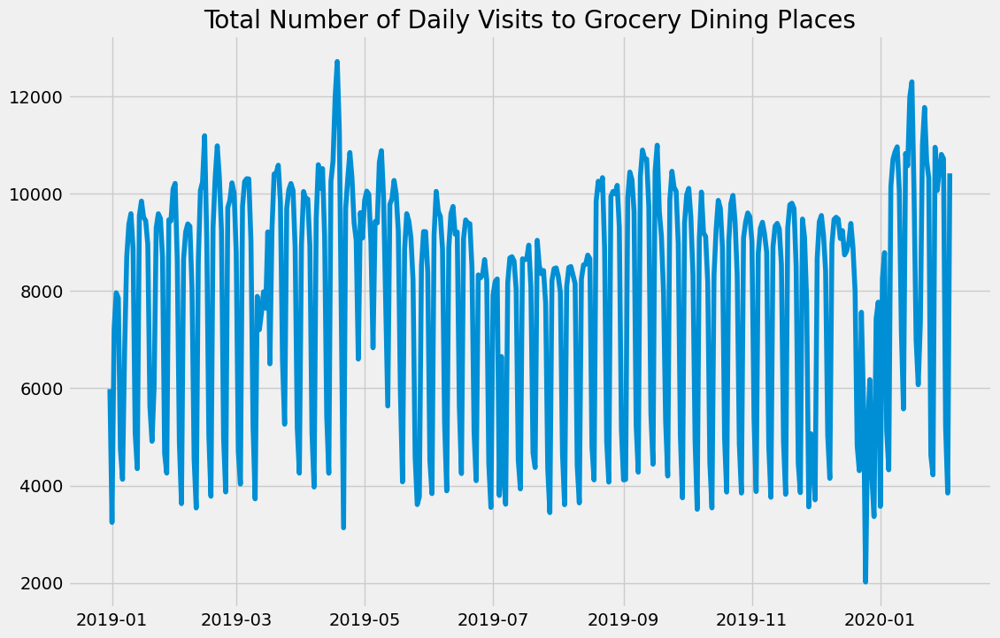

In [35]:
fig, ax = plt.subplots(figsize=(12, 8))
x = agg_df.loc['Restaurants and Other Eating Places', 'daily_visits']
plt.title('Total Number of Daily Visits to Grocery Dining Places')
plt.plot(daily_range, x)
plt.savefig(f"img/total_daily_visits_dining_places.png", bbox_inches = 'tight')

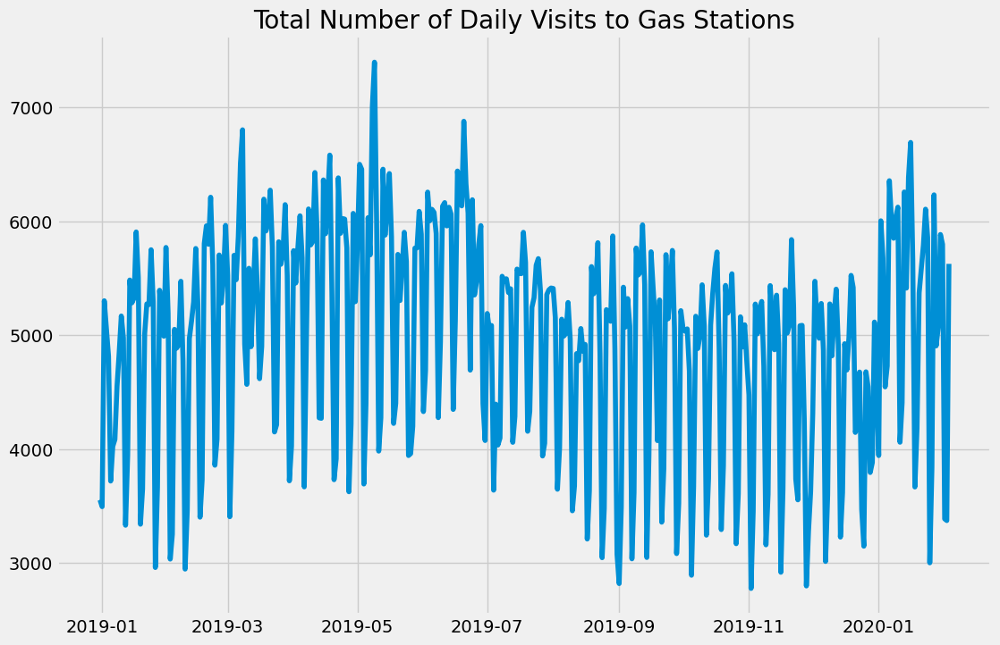

In [36]:
fig, ax = plt.subplots(figsize=(12, 8))
x = agg_df.loc['Gasoline Stations', 'daily_visits']
plt.title('Total Number of Daily Visits to Gas Stations')
plt.plot(daily_range, x)
plt.savefig(f"img/total_daily_visits_gas_stations.png", bbox_inches = 'tight')

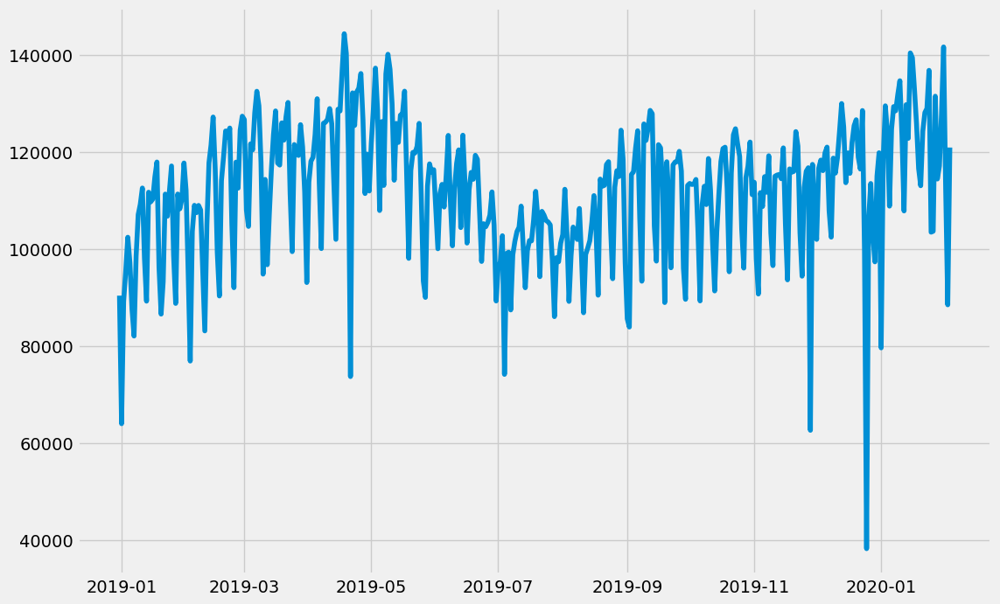

In [37]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(daily_range, agg_df['daily_visits'].sum())
plt.savefig(f"img/total_daily_visits_all.png", bbox_inches = 'tight')

### Checking the gaps

In [38]:
def get_gap_counts(visits_arr, gap_counts=None):
    if gap_counts == None:
        gap_counts = dict()
    gap_size = 0
    for num in visits_arr:
        if num==0:
            gap_size += 1
        else:
            gap_counts[gap_size] = gap_counts.get(gap_size, 0) + 1
            gap_size = 0
    return gap_counts

In [39]:
def get_visit_gaps(orig_df, thres=0):
    df = orig_df.copy()
    gap_counts = dict()
    for index, row in df.iterrows():
        row['visits_by_each_hour'] = np.where(row['visits_by_each_hour']<=thres, 0, row['visits_by_each_hour'])
        gap_counts = get_gap_counts(row['visits_by_each_hour'], gap_counts)
    return gap_counts, df
        
    

In [40]:
def plot_gaps(df, thres=0, save=False, save_path='img/tmp.png'):
    fig, ax = plt.subplots(figsize=(12, 8))
    gap_counts, filtered_df = get_visit_gaps(poi_df, thres=thres)
    ax.bar(*zip(*gap_counts.items()))
    ax.set_yscale("log")
    ax.set_title(f'Gap Counts for Threshold={thres}')
    ax.set_xlabel('Gap Size')
    ax.set_ylabel('Count')
    if save:
        plt.savefig(save_path, bbox_inches = 'tight')


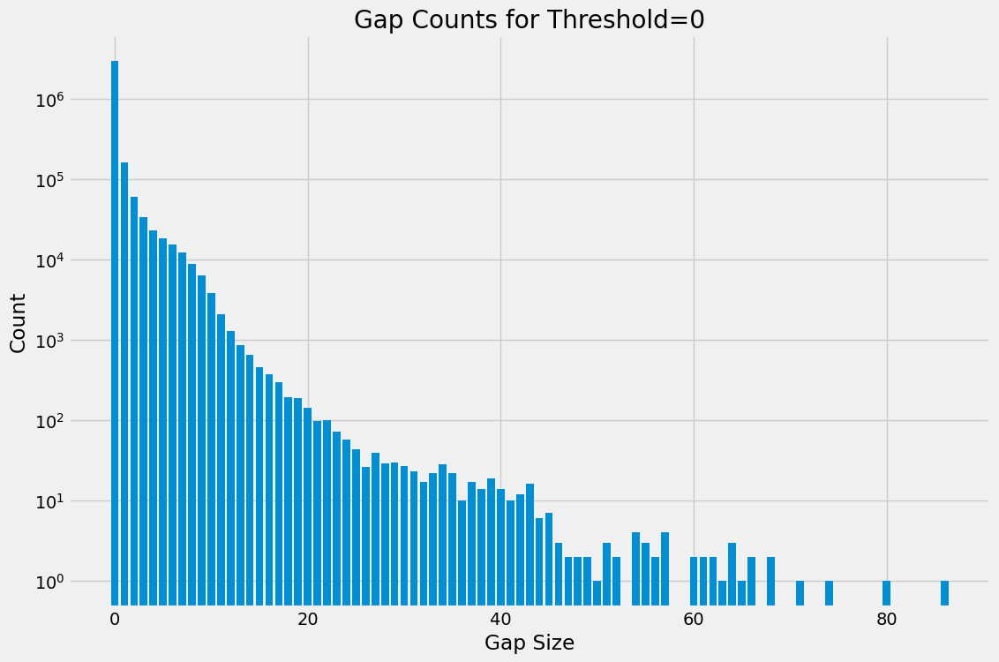

In [41]:
plot_gaps(poi_df, thres=0, save=True, save_path='img/gaps_plot_t0.png')

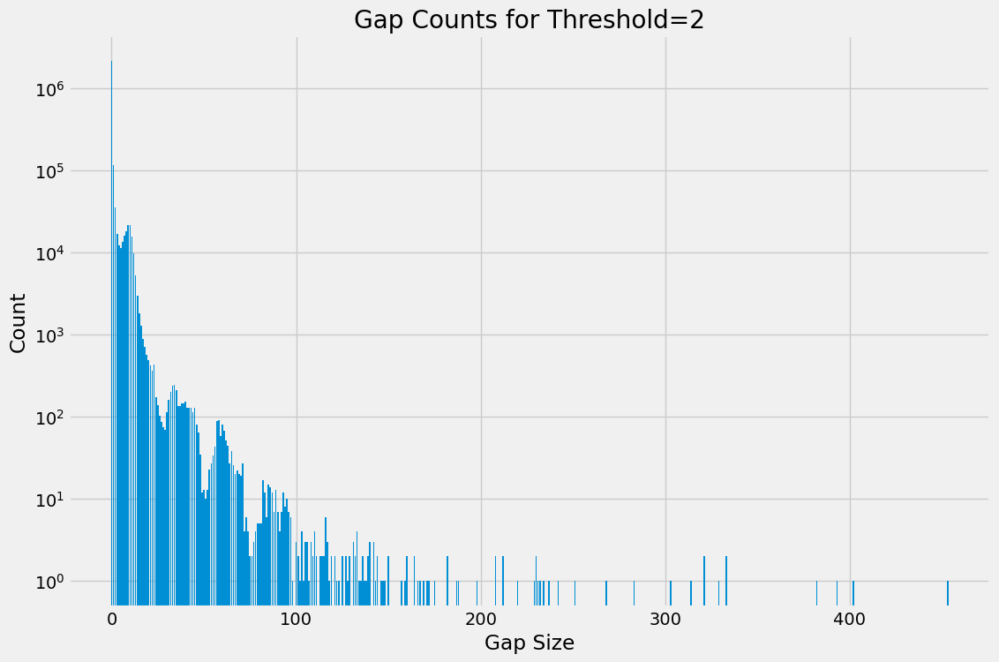

In [42]:
plot_gaps(poi_df, 2, True, 'img/gaps_plot_t2.png')

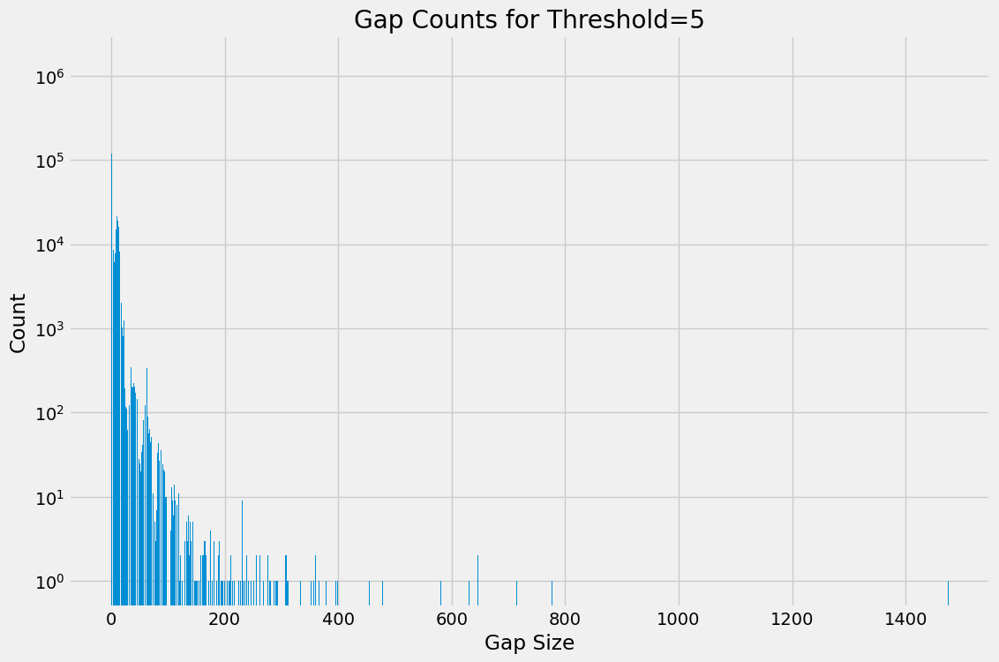

In [43]:
plot_gaps(poi_df, 5, True, 'img/gaps_plot_t5.png')

### Grouping POIs based on MAPE error

In [44]:
poi_err_df.head(3)

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean,mape,mae
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.237504,55.721854
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.297731,26.928987
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall,NaN,Lessors of Real Estate,Malls,531120.0,29.738954,-95.463803,NaN,"{ ""Mon"": [[""10:00"", ""19:00""]], ""Tue"": [[""10:00...",NaN,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.308996,23.249527


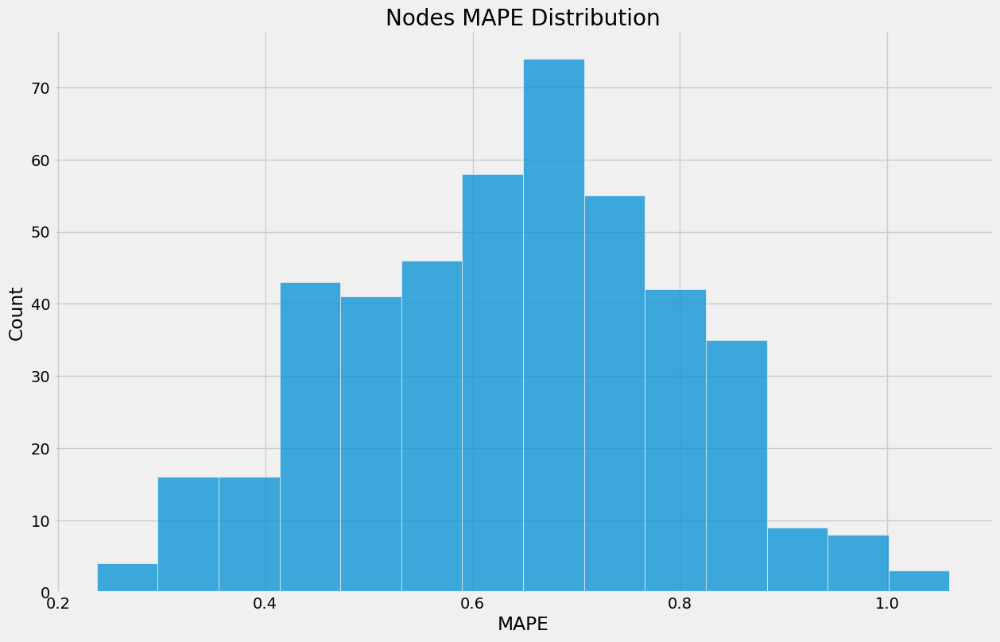

In [45]:
plt.style.use('fivethirtyeight')
sns.displot(poi_err_df['mape'], height=8, aspect=1.6)
plt.xlabel('MAPE')
plt.title('Nodes MAPE Distribution')
plt.savefig(f"img/nodes_mape_dist.png", bbox_inches = 'tight')

In [46]:
poi_err_df['mape_jenks_cut'] = pd.cut(poi_err_df['mape'], 
                                      bins=jenkspy.jenks_breaks(poi_err_df['mape'], nb_class=NUM_BINS), 
                                      include_lowest=True)
poi_err_df['mape_qcut'] = pd.qcut(poi_err_df['mape'], q=NUM_BINS)
poi_err_df.head(3)

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean,mape,mae,mape_jenks_cut,mape_qcut
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.237504,55.721854,"(0.237, 0.534]","(0.237, 0.573]"
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.297731,26.928987,"(0.237, 0.534]","(0.237, 0.573]"
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall,NaN,Lessors of Real Estate,Malls,531120.0,29.738954,-95.463803,NaN,"{ ""Mon"": [[""10:00"", ""19:00""]], ""Tue"": [[""10:00...",NaN,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.308996,23.249527,"(0.237, 0.534]","(0.237, 0.573]"


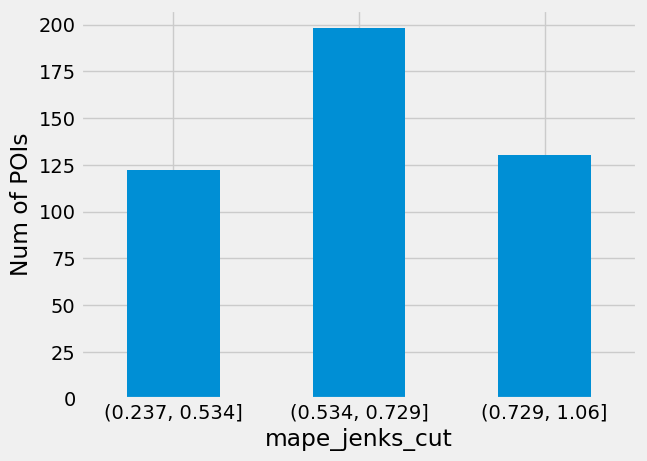

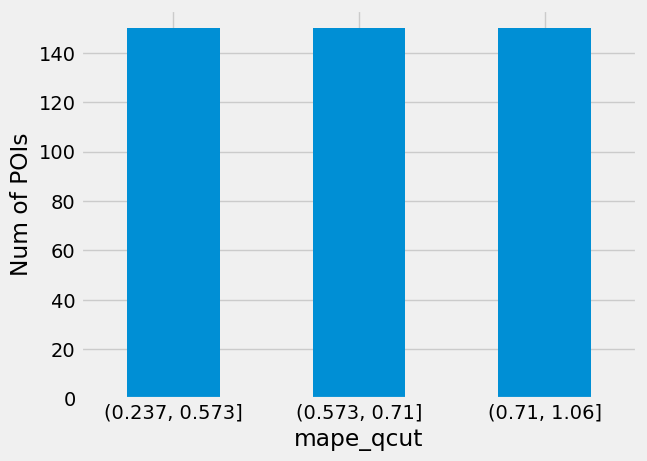

In [47]:
bin_cols_mape = ['mape_jenks_cut', 'mape_qcut']
for agg_col in bin_cols_mape:
    fig, ax = plt.subplots()    
    poi_err_df.groupby(agg_col)['safegraph_place_id'].count().plot(kind='bar', rot=0)
    plt.ylabel('Num of POIs')
    plt.savefig(f"img/num_pois_{agg_col}.png", bbox_inches = 'tight')

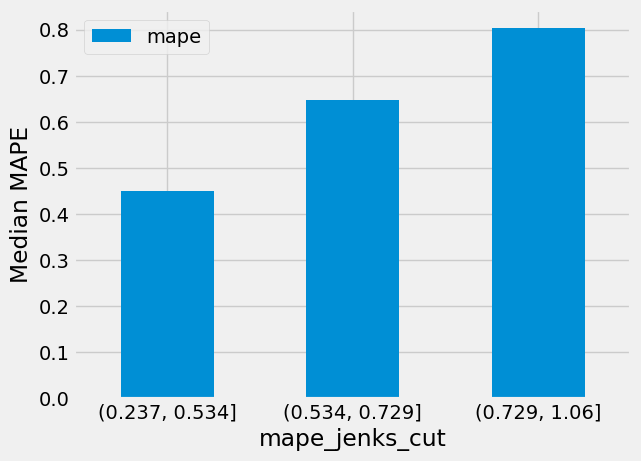

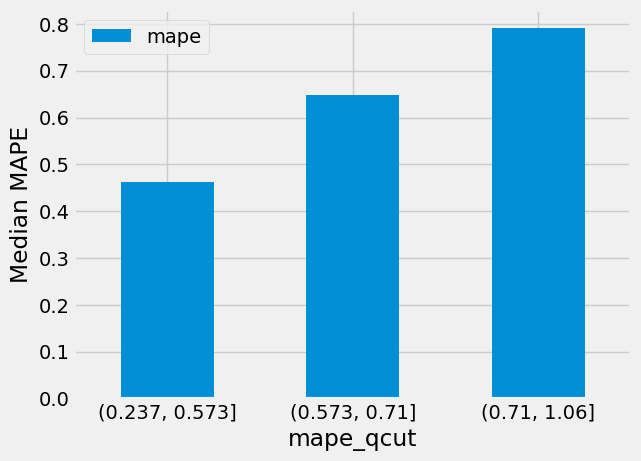

In [74]:
for i, agg_col in enumerate(bin_cols_mape):
    poi_err_df.groupby(agg_col)[['mape']].median().plot(kind='bar', rot=0)
    plt.ylabel('Median MAPE')
    plt.savefig(f"img/median_mape_in_cuts_{agg_col}.png", bbox_inches = 'tight')

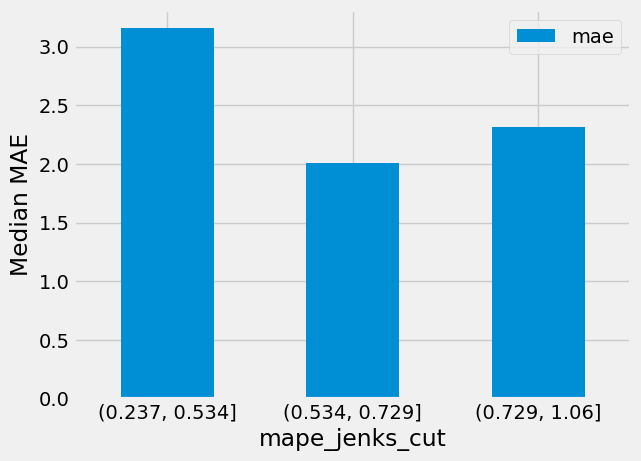

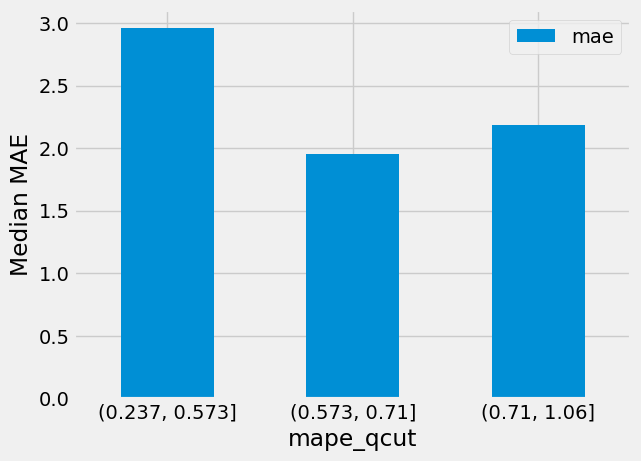

In [78]:
for i, agg_col in enumerate(bin_cols_mape):
    poi_err_df.groupby(agg_col)[['mae']].median().plot(kind='bar', rot=0)
    plt.ylabel('Median MAE')
    plt.savefig(f"img/median_mae_in_cuts_{agg_col}.png", bbox_inches = 'tight')

#### Jenks Cut MAPE

In [80]:
groups_mape = []
grouped_err_df_mape = poi_err_df.groupby('mape_jenks_cut')
for group in grouped_err_df_mape.groups:
    groups_mape.append([group, grouped_err_df_mape.get_group(group)])
len(groups)

3

In [81]:
for group_key, group_df in groups_mape:
    print(f'Group with mape range: {group_key}')
    plot_map(group_df, True, f'img/mape_by_POI_mape_group_{group_key}.png', metric='mape')

Group with mape range: (0.237, 0.534]


Group with mape range: (0.534, 0.729]


Group with mape range: (0.729, 1.06]


#### QCut MAPE

In [52]:
groups_mape = []
grouped_err_df_mape = poi_err_df.groupby('mape_qcut')
for group in grouped_err_df_mape.groups:
    groups_mape.append([group, grouped_err_df_mape.get_group(group)])
len(groups)

3

In [53]:
for group_key, group_df in groups_mape:
    print(f'Group with mape range: {group_key}')
    plot_map(group_df, True, f'img/mape_by_POI_mape_group_{group_key}.png', metric='mape')

Group with mape range: (0.237, 0.573]


Group with mape range: (0.573, 0.71]


Group with mape range: (0.71, 1.06]


#### Checking the groups made by jenks cut

In [82]:
poi_err_df.head(2)

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean,mape,mae,mape_jenks_cut,mape_qcut
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.237504,55.721854,"(0.237, 0.534]","(0.237, 0.573]"
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.297731,26.928987,"(0.237, 0.534]","(0.237, 0.573]"


In [83]:
groups_mape = []
grouped_err_df_mape = poi_err_df.groupby('mape_jenks_cut')
for group in grouped_err_df_mape.groups:
    groups_mape.append([group, grouped_err_df_mape.get_group(group)])
len(groups)

3

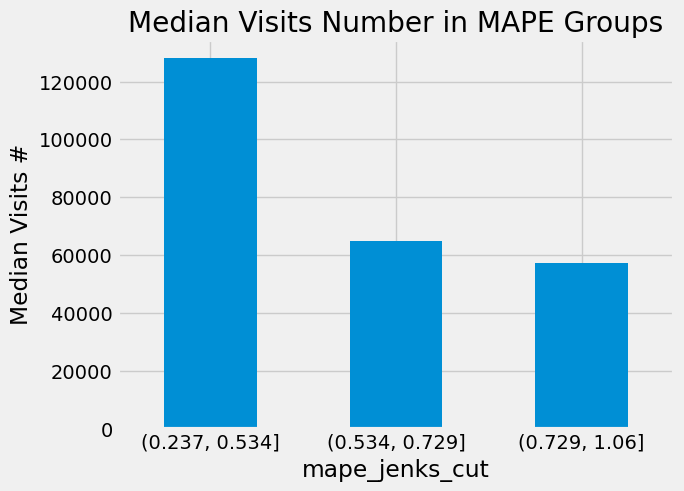

In [84]:
grouped_err_df_mape['raw_visit_counts'].median().plot(kind='bar', rot=0)
plt.title('Median Visits Number in MAPE Groups')
plt.ylabel('Median Visits #')
plt.savefig(f"img/mape_jenks_cut_median_visits_num.png", bbox_inches = 'tight')


In [85]:
poi_err_df['top_category'].value_counts()

Lessors of Real Estate                                                                   132
Restaurants and Other Eating Places                                                       43
Elementary and Secondary Schools                                                          31
General Merchandise Stores, including Warehouse Clubs and Supercenters                    30
Grocery Stores                                                                            27
Building Material and Supplies Dealers                                                    18
Other Amusement and Recreation Industries                                                 18
Museums, Historical Sites, and Similar Institutions                                       14
Gasoline Stations                                                                         13
General Medical and Surgical Hospitals                                                    13
Department Stores                                                     

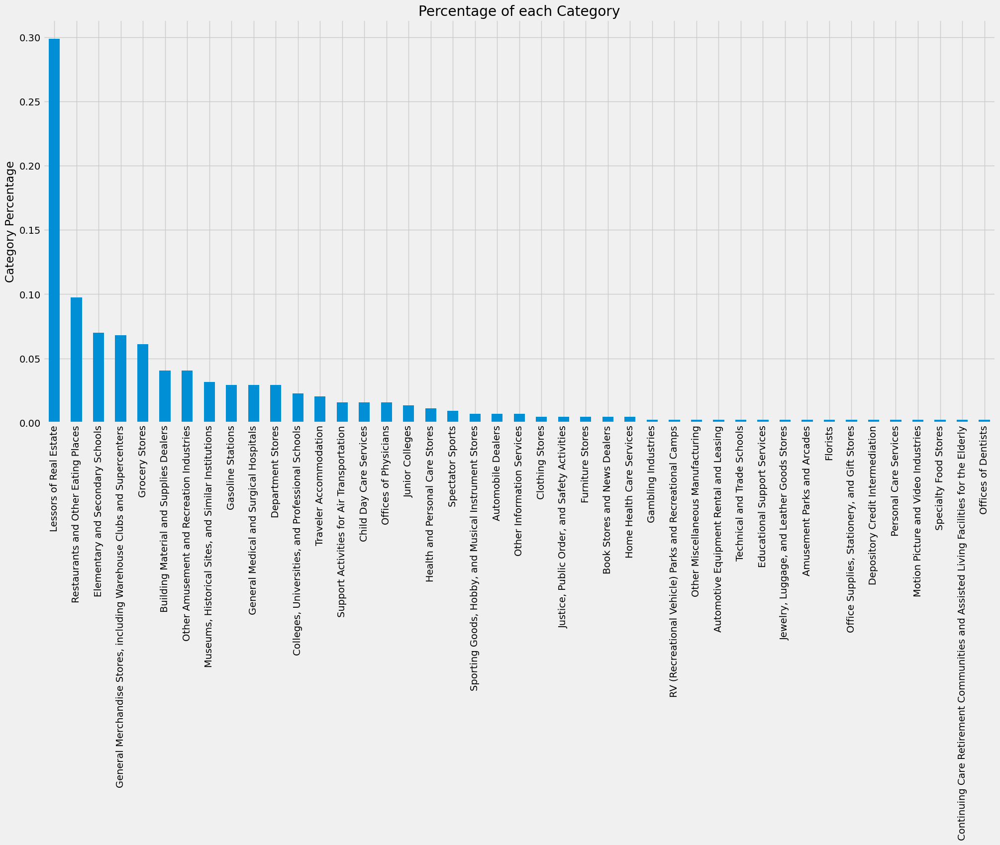

In [89]:
poi_err_df['top_category'].value_counts(normalize=True).plot(kind='bar', figsize=(22,10))
plt.title('Percentage of each Category')
plt.ylabel('Category Percentage')
plt.savefig(f"img/percentage_of_each_category_all.png", bbox_inches = 'tight')

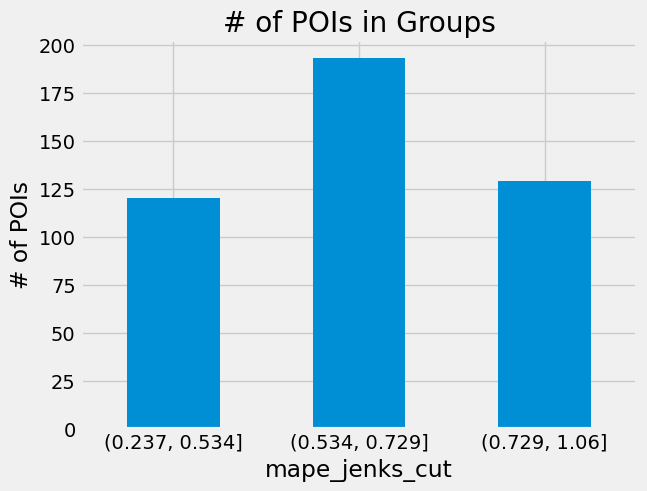

In [59]:
grouped_err_df_mape['top_category'].count().plot(kind='bar', rot=0)
plt.title('# of POIs in Groups')
plt.ylabel('# of POIs')
plt.savefig(f"img/mape_cut_poi_count.png", bbox_inches = 'tight')

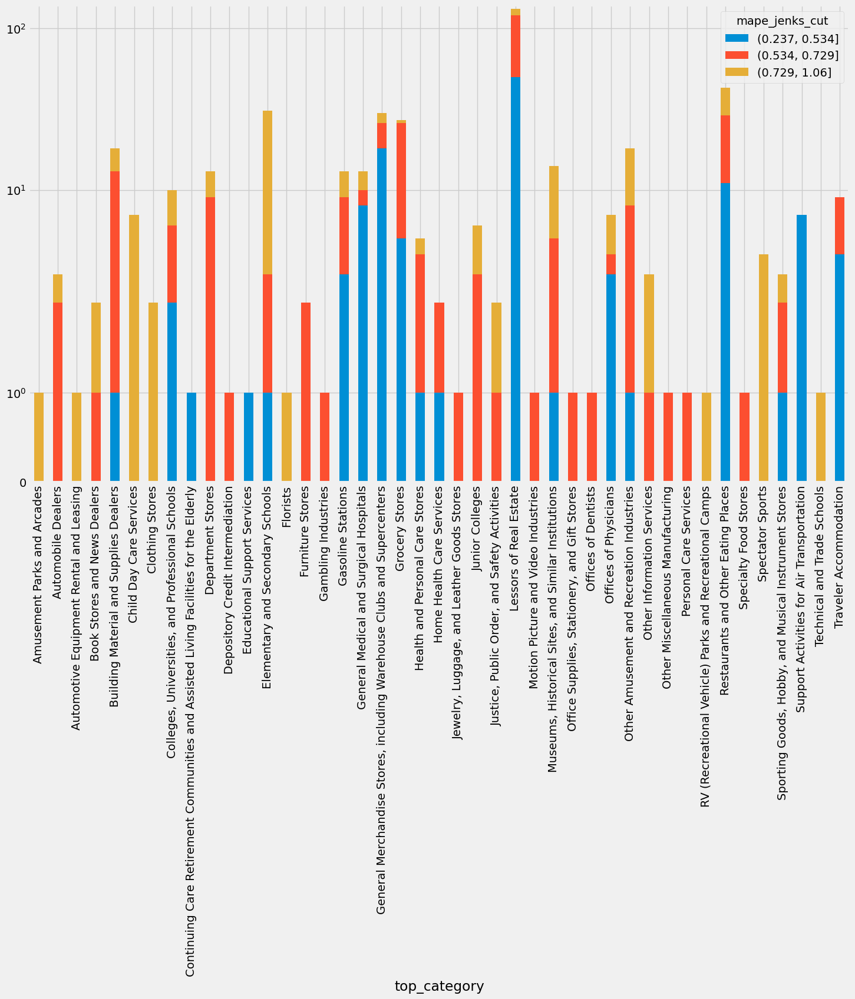

In [60]:
grouped_err_df_mape['top_category'].value_counts().unstack().T.plot(kind='bar', figsize=(16,10), stacked=True)
plt.yscale('symlog')

<AxesSubplot:xlabel='top_category'>

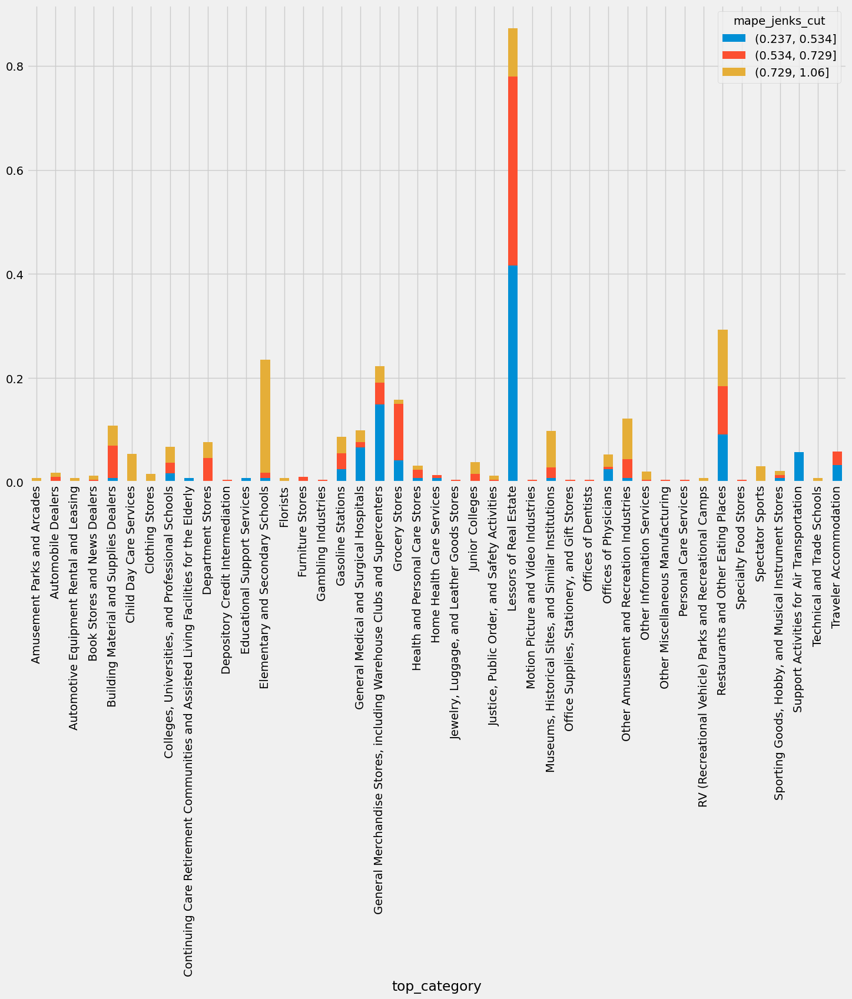

In [61]:
grouped_err_df_mape['top_category'].value_counts(normalize=True).unstack().T.plot(kind='bar', figsize=(16,10), stacked=True)


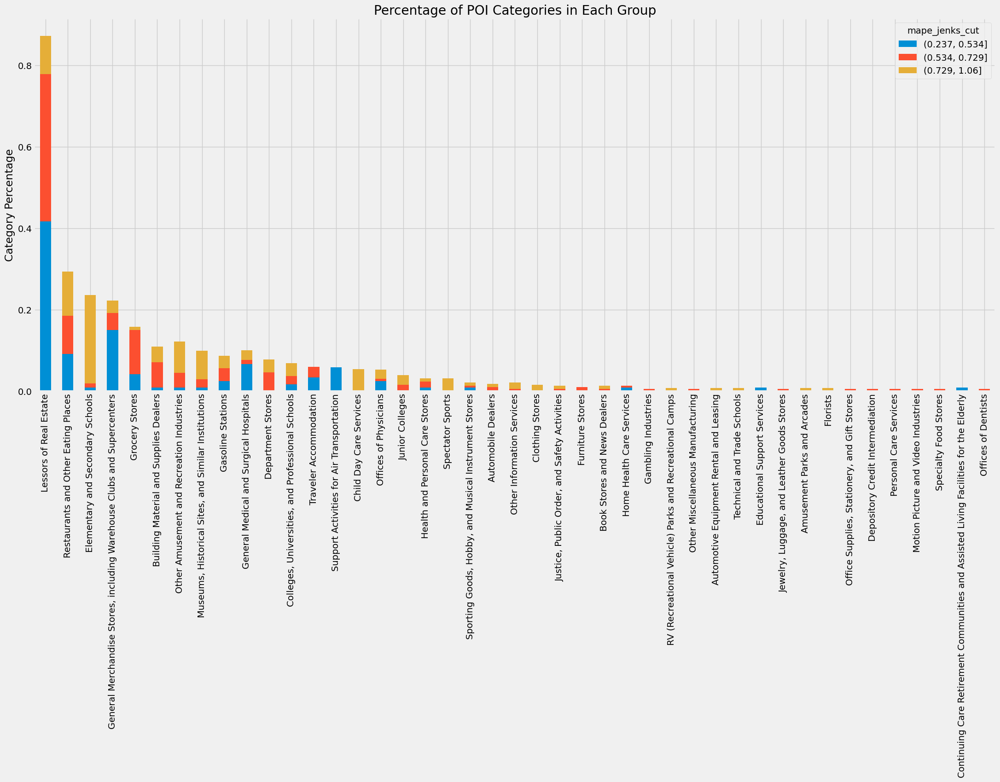

In [90]:
orig_cat_index = poi_err_df['top_category'].value_counts(normalize=True).index
grouped_err_df_mape['top_category'].value_counts(normalize=True).unstack().T.reindex(orig_cat_index).plot(kind='bar', figsize=(24,10), stacked=True)
plt.title('Percentage of POI Categories in Each Group')
plt.ylabel('Category Percentage')
plt.savefig(f"img/percentage_of_each_category_in_groups.png", bbox_inches = 'tight')


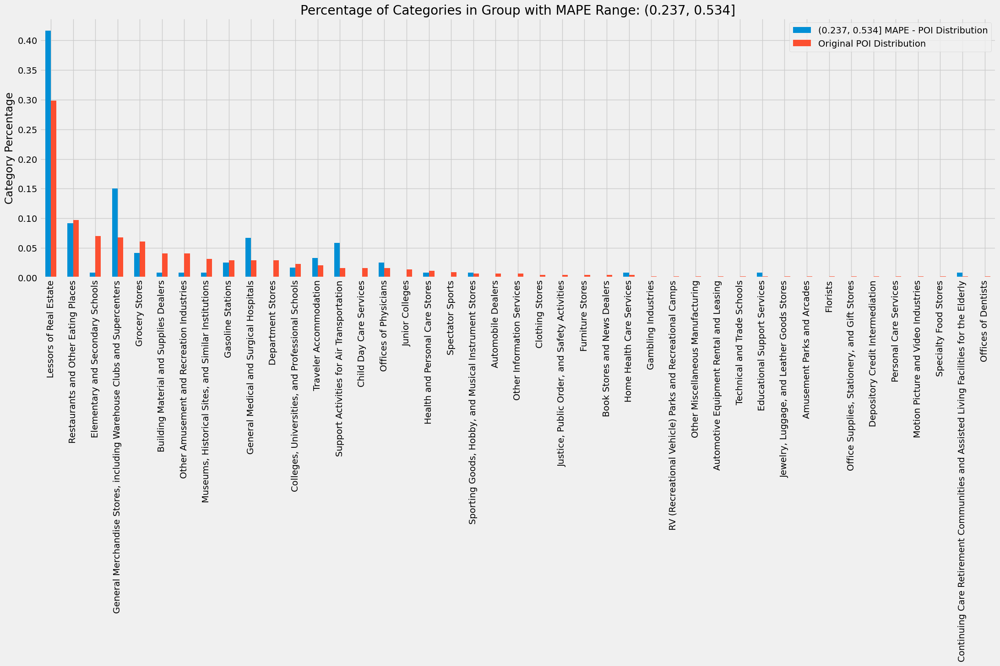

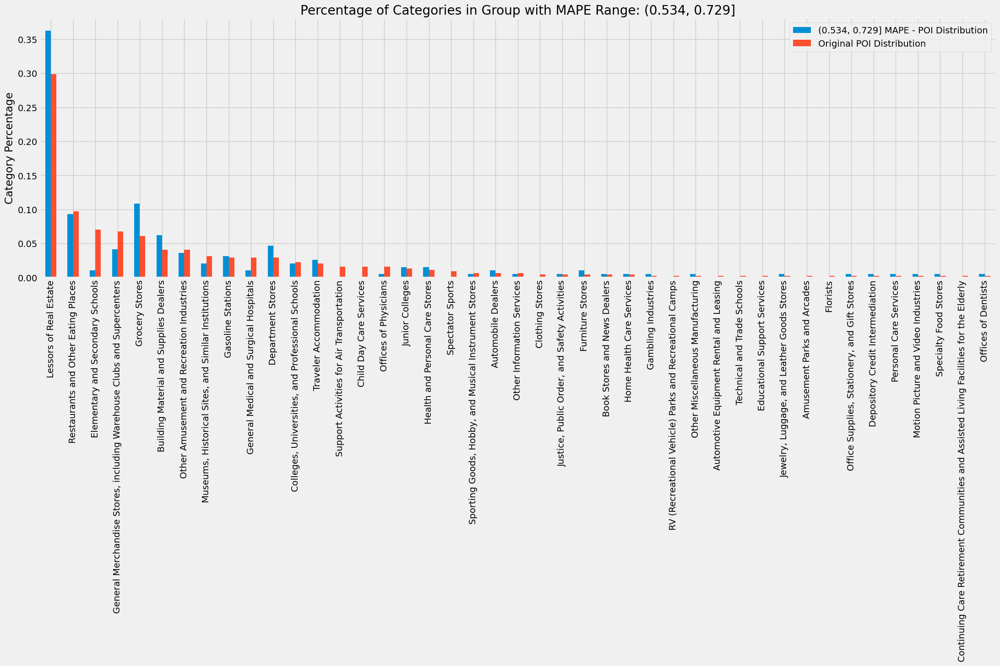

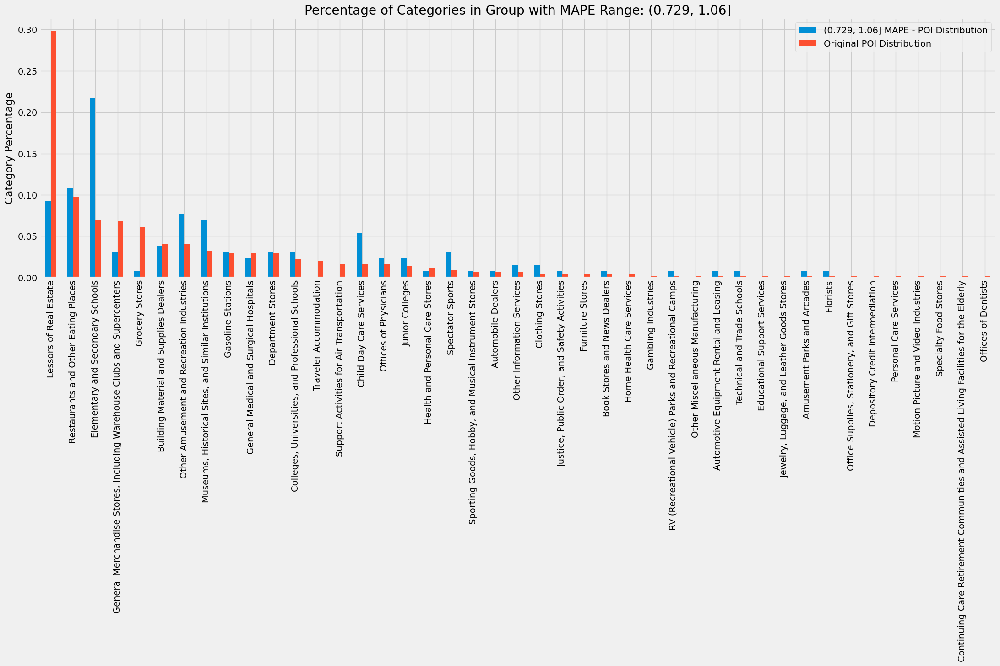

In [91]:
colors = ['C0', 'C1', 'C2']
for i, (group_key, group_df) in enumerate(groups_mape):
    group_poi_dist_ser = group_df['top_category'].value_counts(normalize=True).reindex(orig_cat_index)
    orig_poi_dist_ser = poi_err_df['top_category'].value_counts(normalize=True)
    new_poi_dist_df = pd.DataFrame({f'{group_key} MAPE - POI Distribution': group_poi_dist_ser,
                                    'Original POI Distribution': orig_poi_dist_ser})
    new_poi_dist_df.plot(kind='bar', figsize=(24,7))
    plt.title(f'Percentage of Categories in Group with MAPE Range: {group_key}')
    plt.ylabel('Category Percentage')
    plt.savefig(f"img/percentage_of_each_category_in_group_mape_range_{group_key}.png", bbox_inches = 'tight')

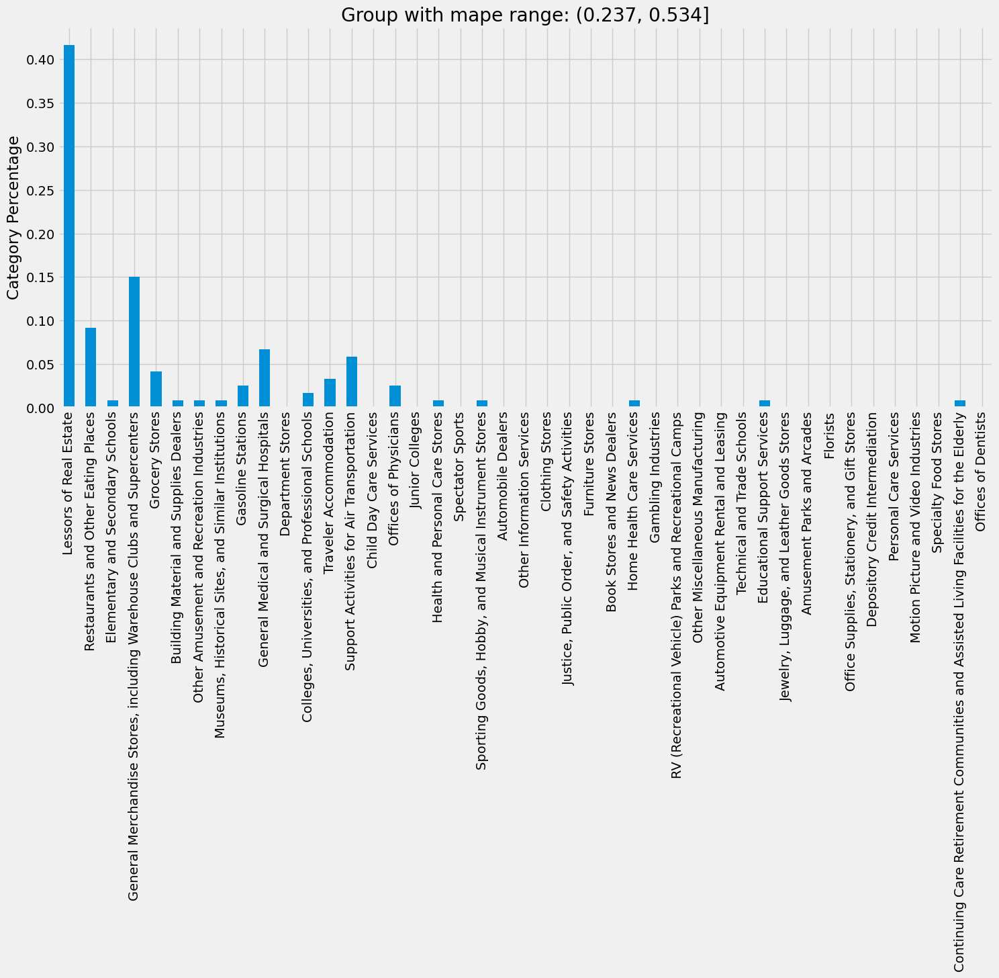

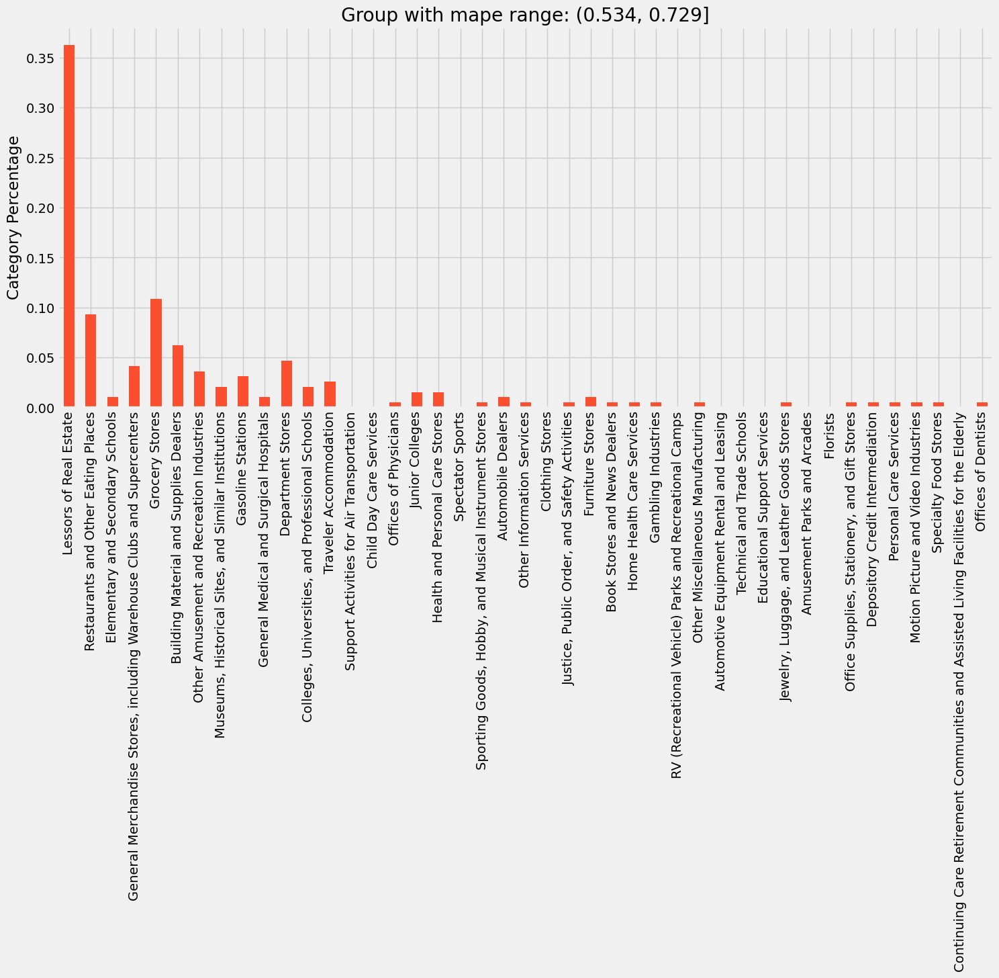

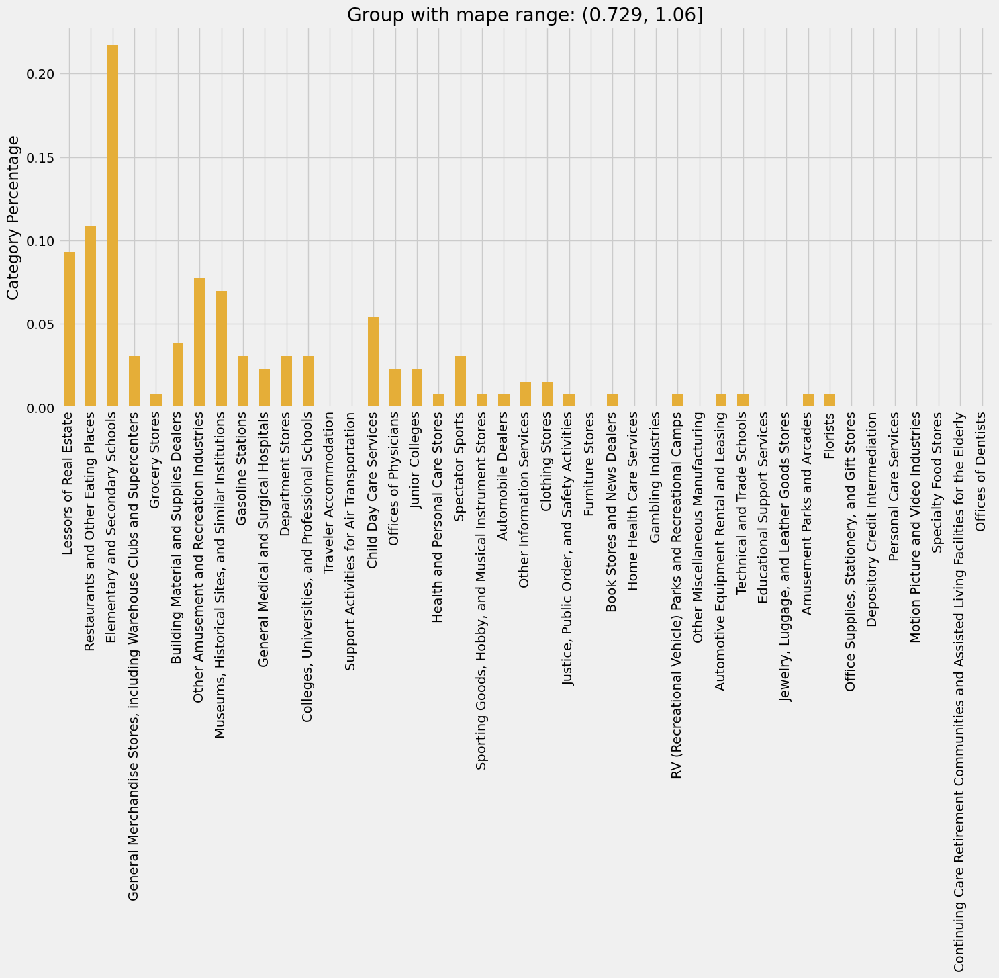

In [64]:
colors = ['C0', 'C1', 'C2']
for i, (group_key, group_df) in enumerate(groups_mape):
    plt.subplots(figsize=(16,10))
    plt.title(f'Group with mape range: {group_key}')
    plt.ylabel('Category Percentage')
    group_df['top_category'].value_counts(normalize=True).reindex(orig_cat_index).plot(kind='bar', figsize=(16,7), color=colors[i])
    # poi_err_df['top_category'].value_counts(normalize=True).plot(kind='bar', figsize=(16,10), alpha=0.3, color='Green')

In [65]:
poi_err_df.head()

,safegraph_place_id,visits_by_day,visits_by_each_hour,raw_visit_counts,location_name,street_address,city,region,postal_code,iso_country_code,safegraph_brand_ids,brands,parent_safegraph_place_id,top_category,sub_category,naics_code,latitude,longitude,phone_number,open_hours,category_tags,median_visits,cut_jenks_med,cut_jenks_mean,qcut_med,qcut_mean,mape,mae,mape_jenks_cut,mape_qcut
0,sg:4cc165ff43ec4ce29e9dbe0732267ab1,"[6428, 6911, 8643, 8195, 7936, 7265, 8236, 614...","[74, 42, 23, 123, 220, 284, 338, 311, 493, 331...",3626878,George Bush Intercontinental Airport,2800 N Terminal Rd,Houston,TX,77032,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.981382,-95.322839,NaN,NaN,NaN,7968.0,"(3214.0, 7968.0]","(3208.0, 7995.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.237504,55.721854,"(0.237, 0.534]","(0.237, 0.573]"
1,sg:e8af4e248bbf41549aaec725d038ee42,"[2681, 3062, 3678, 3380, 3220, 3136, 3435, 255...","[23, 16, 8, 34, 72, 107, 143, 148, 212, 112, 1...",1448988,American Express Centurion Lounge,2800 N Terminal Rd Terminal D,Houston,TX,77032,US,NaN,NaN,sg:f4a955def8ca49fd87153af82a237245,Gasoline Stations,Gasoline Stations with Convenience Stores,447110.0,29.987829,-95.334916,NaN,"{ ""Mon"": [[""5:30"", ""21:00""]], ""Tue"": [[""5:30"",...",NaN,3214.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.297731,26.928987,"(0.237, 0.534]","(0.237, 0.573]"
2,sg:01cebfb757224fbd8151ee6ac6b0d679,"[3688, 3007, 3308, 3478, 3947, 4036, 2419, 212...","[8, 1, 4, 3, 5, 12, 18, 50, 61, 102, 158, 239,...",1380483,Simon mall,5085 Westheimer Rd,Houston,TX,77056,US,SG_BRAND_0a3c99595c9d3fddfece9c4e7607e5b3,Simon mall,NaN,Lessors of Real Estate,Malls,531120.0,29.738954,-95.463803,NaN,"{ ""Mon"": [[""10:00"", ""19:00""]], ""Tue"": [[""10:00...",NaN,2818.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.308996,23.249527,"(0.237, 0.534]","(0.237, 0.573]"
3,sg:73e44ffdbcb24363bf01b6158373b9f3,"[2479, 2866, 3465, 3178, 3023, 2940, 3209, 240...","[19, 12, 8, 31, 67, 98, 127, 136, 192, 108, 16...",1350310,George Bush Intercontinental Airport Terminal E,3950 S Terminal Terminal E,Houston,TX,77066,US,NaN,NaN,sg:7dea7a58e8424b22ba0d0b96bc1b6cc9,Traveler Accommodation,Hotels (except Casino Hotels) and Motels,721110.0,29.986670,-95.337942,NaN,NaN,NaN,2980.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.295219,24.901680,"(0.237, 0.534]","(0.237, 0.573]"
4,sg:360d88ef2ced4be180ea24290b9f9df4,"[2410, 2607, 3235, 2913, 2806, 2217, 3011, 217...","[28, 45, 53, 36, 94, 116, 104, 132, 103, 189, ...",1240632,William P Hobby Airport,7800 Airport Blvd,Houston,TX,77061,US,NaN,NaN,NaN,Support Activities for Air Transportation,Other Airport Operations,488119.0,29.646145,-95.277014,1.713640e+10,NaN,NaN,2710.0,"(1198.0, 3214.0]","(1300.0, 3208.0]","(188.333, 7968.0]","(199.0, 7995.0]",0.279968,23.901681,"(0.237, 0.534]","(0.237, 0.573]"


In [92]:
poi_cat_err_df = poi_err_df.groupby('top_category')[['mape', 'mae']].median()
poi_cat_err_df['count'] = poi_err_df.groupby('top_category').size()

In [93]:
poi_cat_err_df.loc[poi_cat_err_df['count'] > 10]

,mape,mae,count
top_category,,,
Building Material and Supplies Dealers,0.703877,1.656132,18
Department Stores,0.715798,2.032360,13
Elementary and Secondary Schools,0.825130,3.231593,31
Gasoline Stations,0.656140,1.846219,13
General Medical and Surgical Hospitals,0.499545,2.318071,13
"General Merchandise Stores, including Warehouse Clubs and Supercenters",0.491923,2.859286,30
Grocery Stores,0.649197,1.801534,27
Lessors of Real Estate,0.584198,2.457146,132
"Museums, Historical Sites, and Similar Institutions",0.777566,2.778855,14


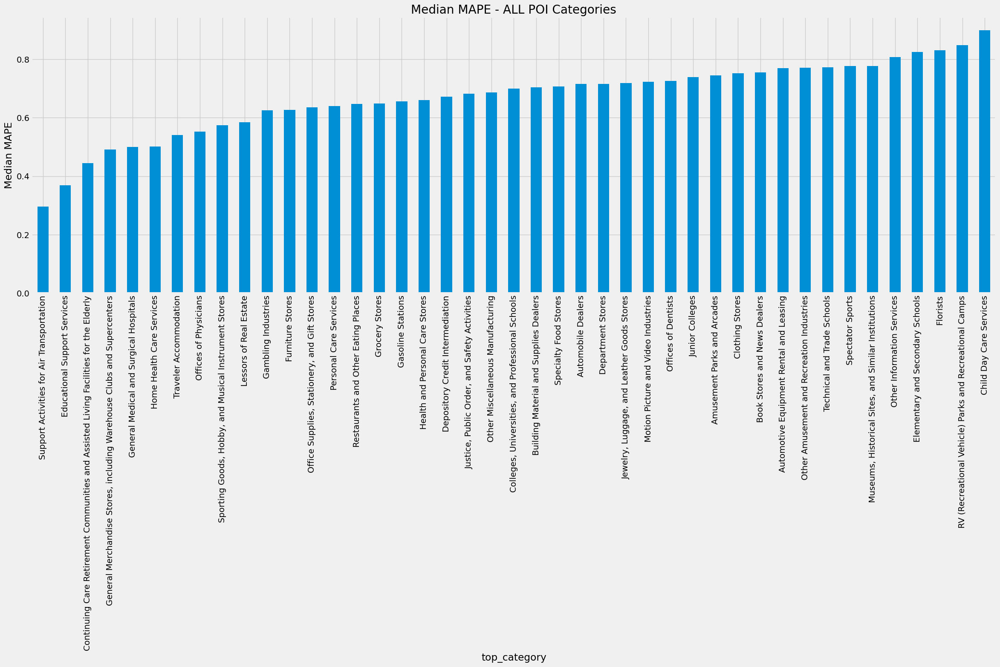

In [96]:
poi_cat_err_df.sort_values(by='mape')['mape'].plot(kind='bar', figsize=(26, 8))
plt.title('Median MAPE - ALL POI Categories')

plt.ylabel('Median MAPE') 
plt.savefig(f"img/median_mape_by_categories_all.png", bbox_inches = 'tight')

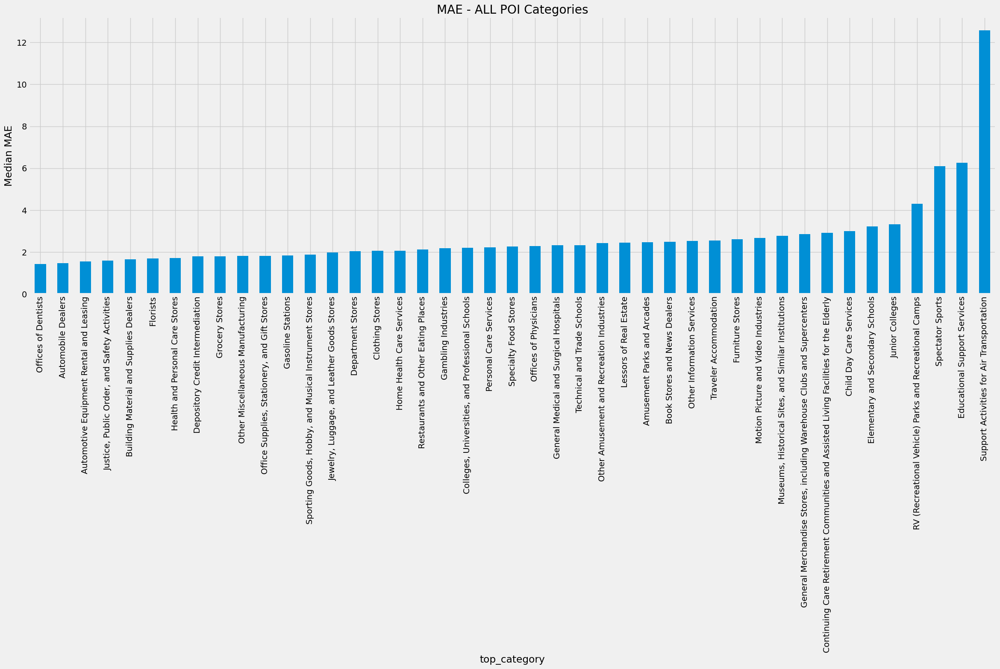

In [97]:
poi_cat_err_df.sort_values(by='mae')['mae'].plot(kind='bar', figsize=(26, 8))
plt.title('MAE - ALL POI Categories')
plt.ylabel('Median MAE') 
plt.savefig(f"img/median_mae_by_categories_all.png", bbox_inches = 'tight')

Text(0.5, 1.0, 'MAPE - POI Categories w/ at least 10 POIs')

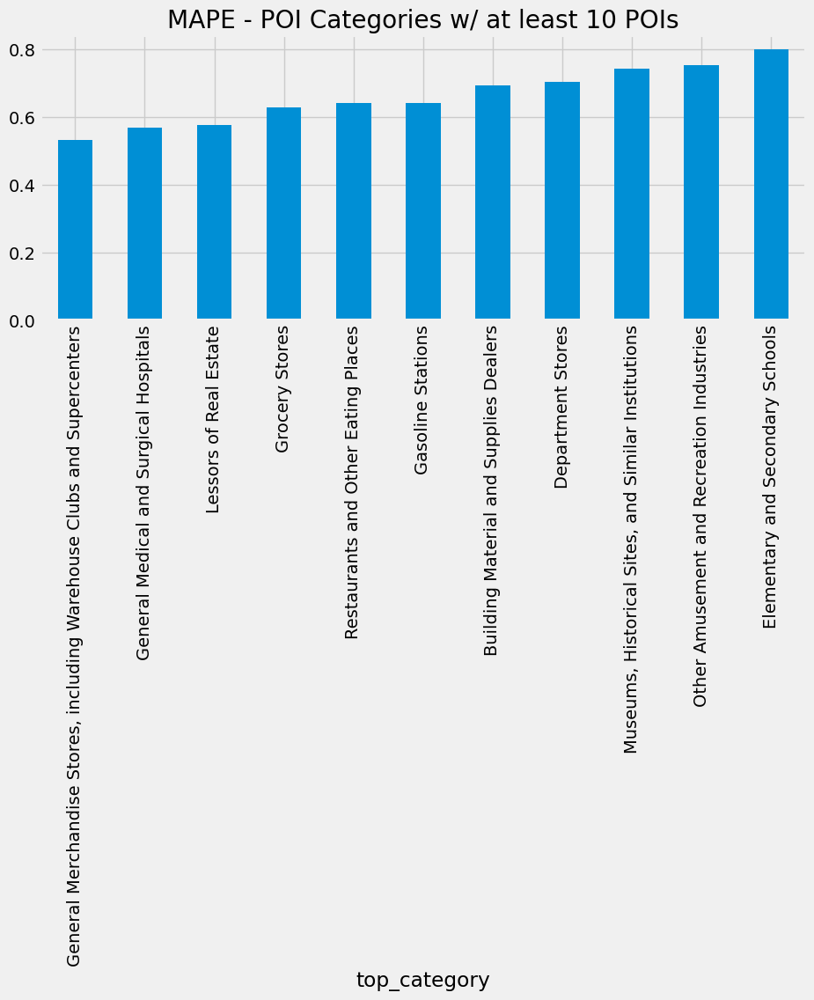

In [70]:
poi_cat_err_df.loc[poi_cat_err_df['count'] > 10].sort_values(by='mape')['mape'].plot(kind='bar', figsize=(10, 4))
plt.title('MAPE - POI Categories w/ at least 10 POIs')

Text(0.5, 1.0, 'MAE - POI Categories w/ at least 10 POIs')

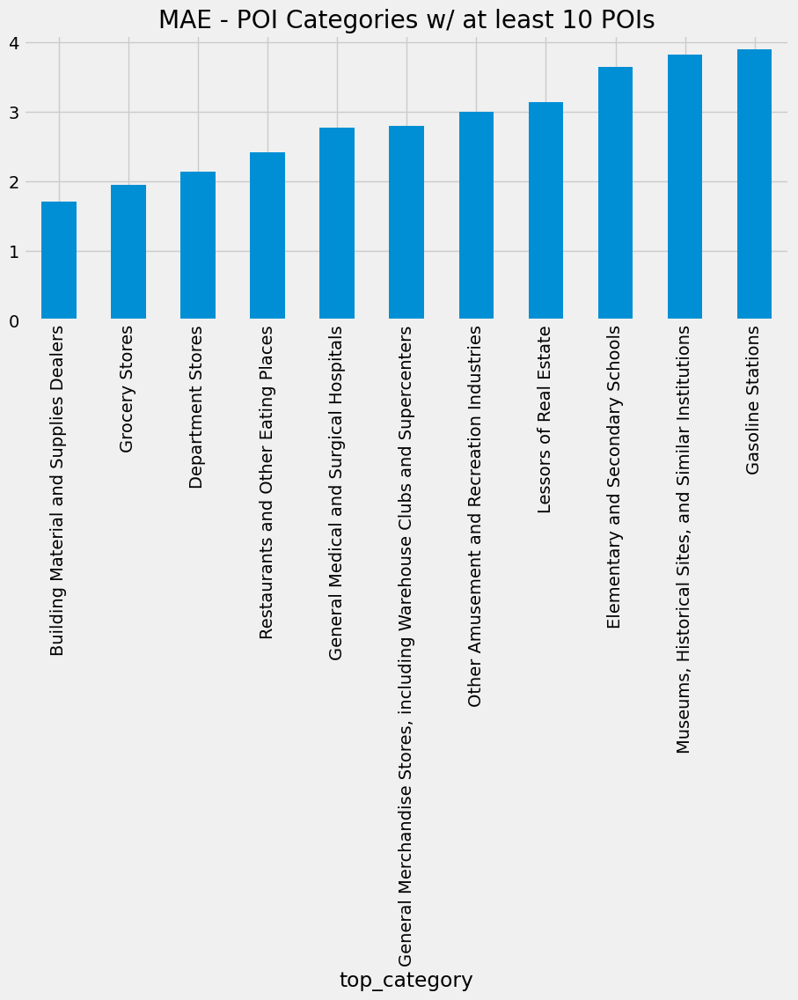

In [71]:
poi_cat_err_df.loc[poi_cat_err_df['count'] > 10].sort_values(by='mae')['mae'].plot(kind='bar', figsize=(10, 4))
plt.title('MAE - POI Categories w/ at least 10 POIs')